In [4]:
import os
import numpy as np
import netCDF4 as netcdf
from pathlib import Path
from tqdm import tqdm
from concorde.plots import *
from concorde.tools import *
import matplotlib.pyplot as plt
import matplotlib as mpl
import geopandas as gpd
import pandas as pd

from shapely.geometry import Point, LineString
import tcmarkers
from matplotlib import colors
from matplotlib.gridspec import GridSpec
import cmocean

In [47]:
path_tracks = Path(r'../data/tracks/climada')
tracks = pd.read_pickle(path_tracks/'tracksNC_historicalStorms.pkl')
cmap = plt.cm.plasma_r
norm = colors.BoundaryNorm(np.arange(0, 7, 1), cmap.N)

#### 02c

In [10]:
pathin = Path(r'../models/adcirc//concorde/batch02/_results/02c')
runs = os.listdir(pathin)

In [19]:
track.describe().T

,count,mean,std,min,25%,50%,75%,max
radius_max_wind,133.0,26.661654,19.333551,5.000000,15.000000,25.000000,30.000000,90.000000
radius_oci,133.0,184.789474,82.227882,120.000000,120.000000,130.000000,250.000000,360.000000
max_sustained_wind,133.0,84.180450,34.801567,25.000000,50.000000,85.000000,100.000000,160.000000
central_pressure,133.0,969.375916,28.418037,910.000000,954.000000,961.000000,1002.000000,1011.000000
environmental_pressure,133.0,1011.774436,1.607824,1007.000000,1011.000000,1012.000000,1012.000000,1015.000000
time_step,133.0,2.864662,0.478670,0.500000,3.000000,3.000000,3.000000,3.000000
lat,133.0,25.364130,10.569143,10.300000,16.034906,26.357489,30.700001,51.599998
lon,133.0,-68.092651,9.618974,-79.714989,-77.699997,-68.900002,-61.200001,-46.400002


['Dorian', 'Florence', 'Isaias', 'Matthew', 'Isabel']

  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [01:12<00:00,  7.22s/it]


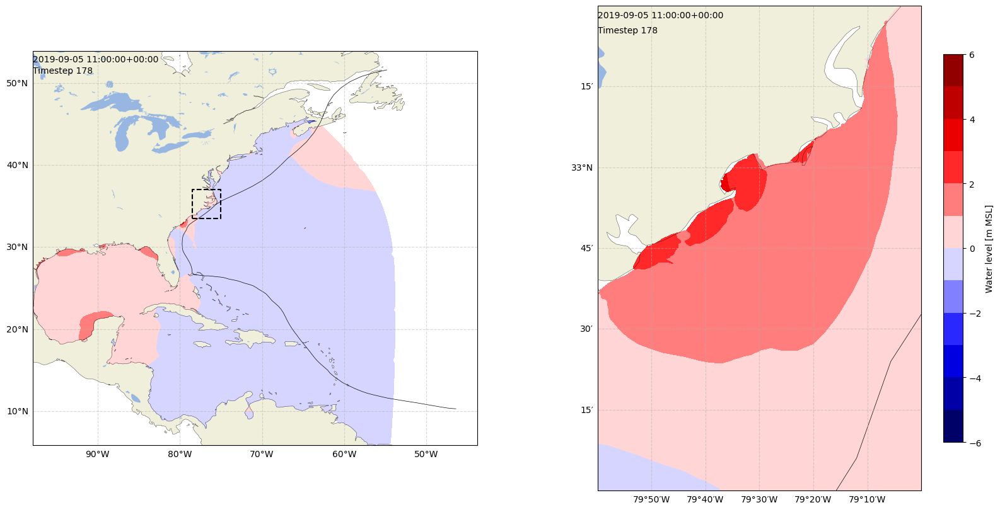

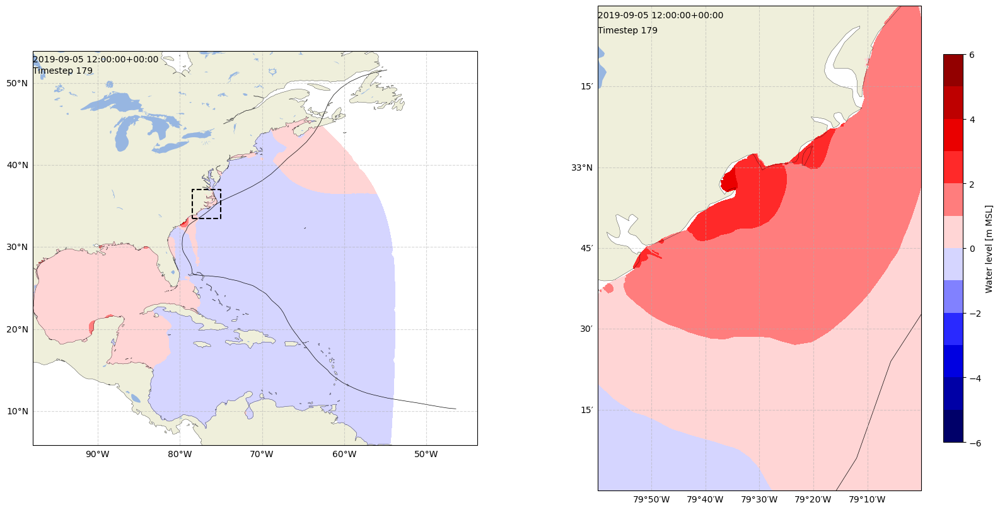

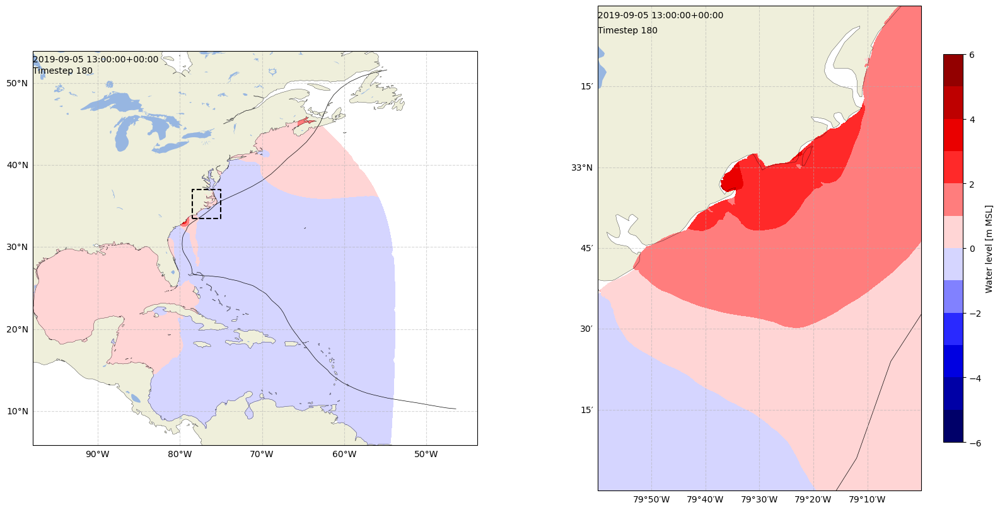

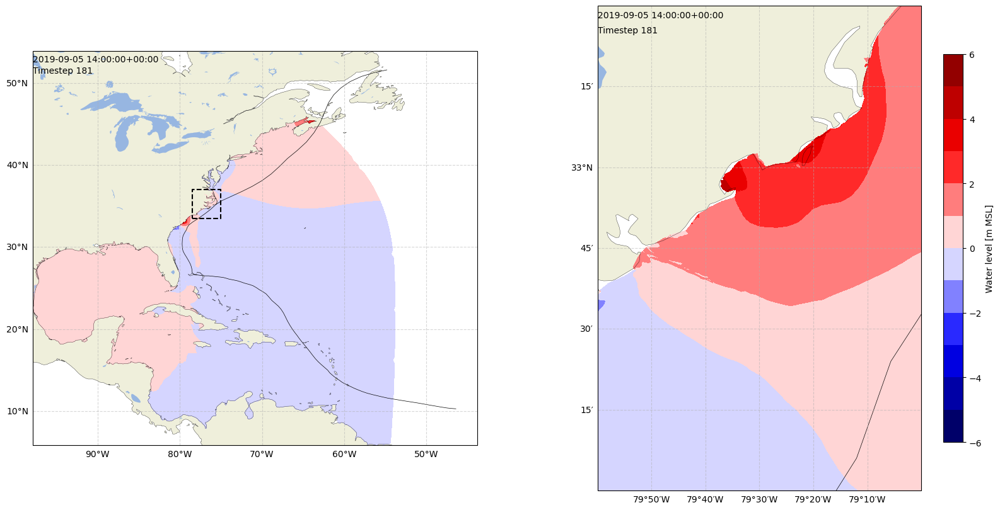

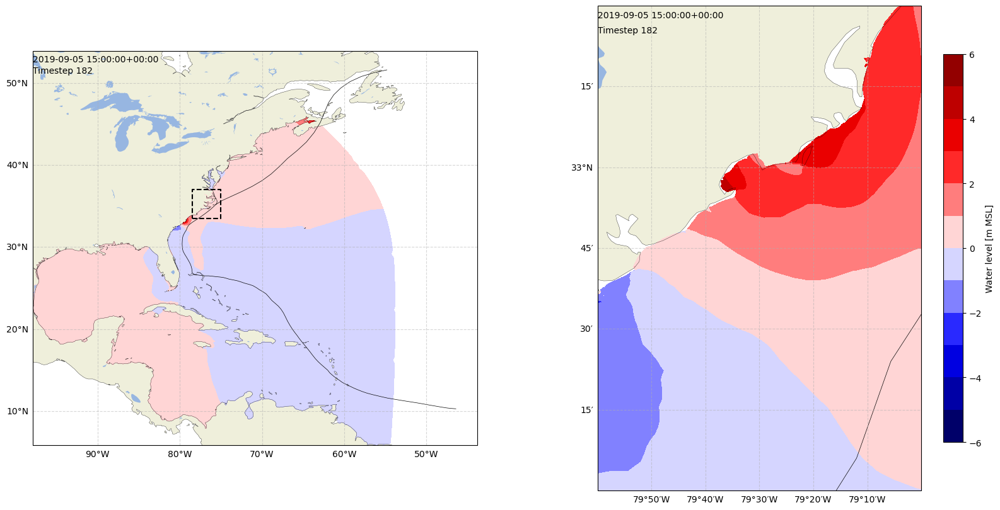

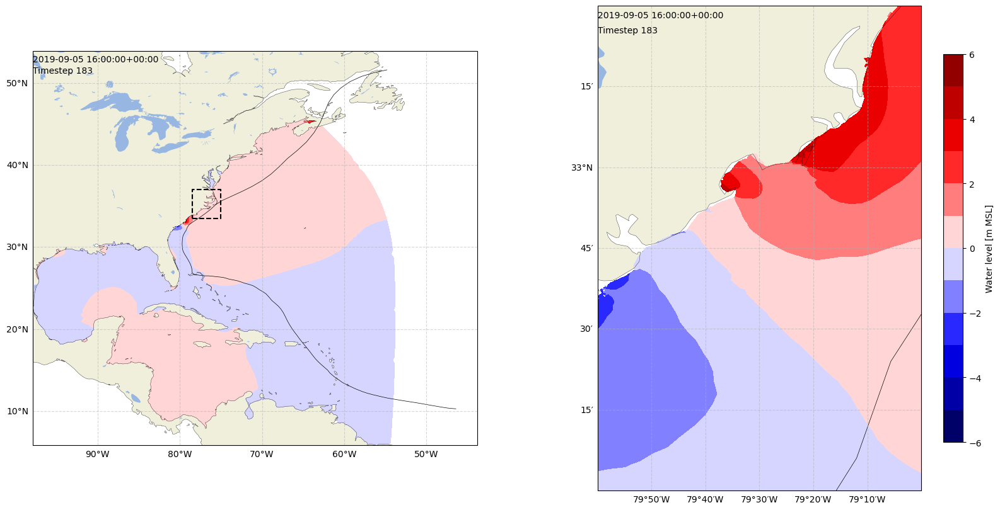

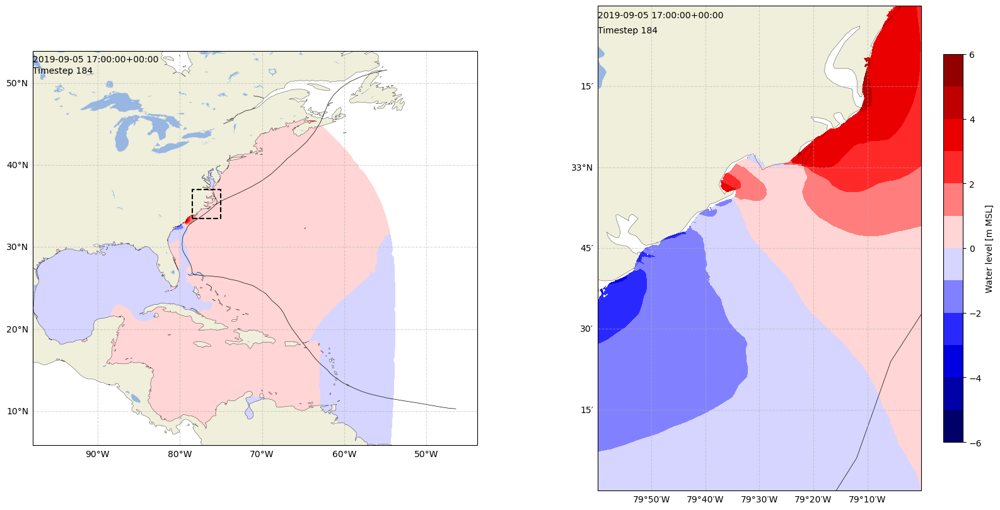

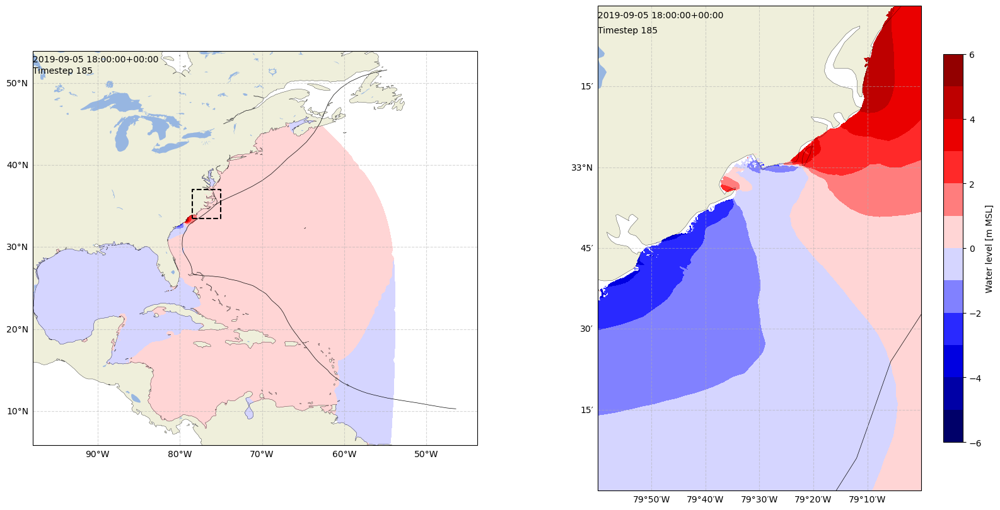

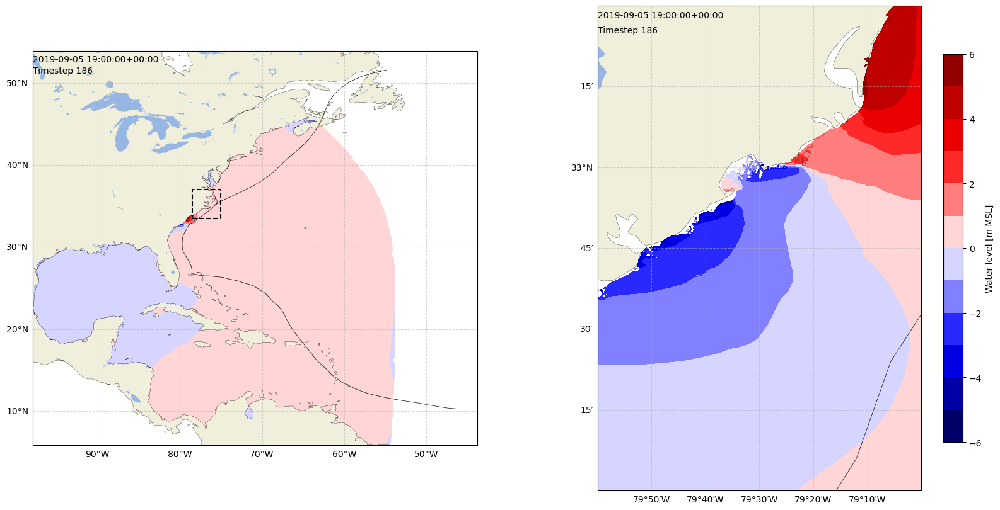

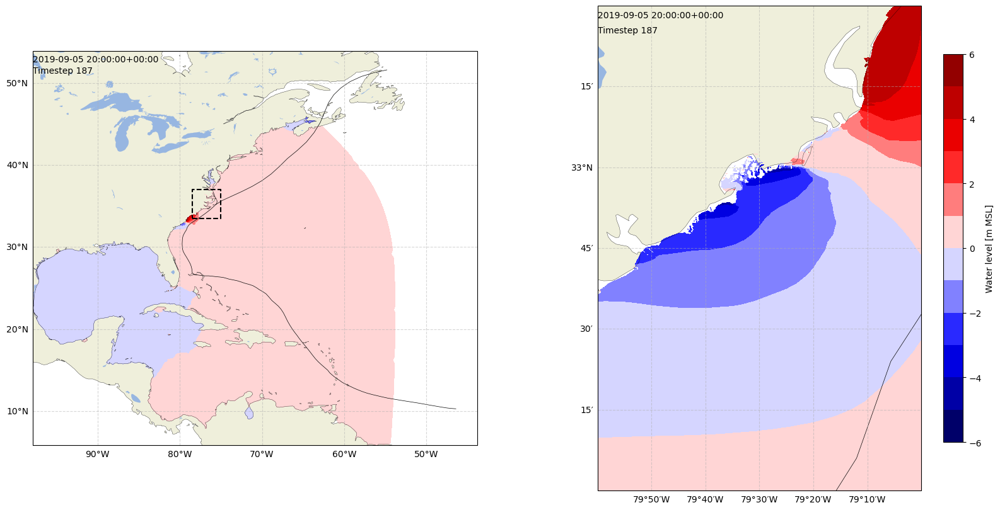

In [35]:
run = runs[0]
track = tracks[run.upper()]
track['max_sustained_wind_ms'] = [x/1.94384 for x in track['max_sustained_wind']]
track['cat'] = [ssScale(x) for x in track['max_sustained_wind_ms'].values]

nc1 = netcdf.Dataset(pathin/run/'fort.63.nc', 'r')
nc2 = netcdf.Dataset(pathin/run/'fort.74.nc', 'r')

ts = list(range(nc1['time'].size))
dates = [pd.to_datetime(nc1['time'].base_date) + pd.Timedelta(seconds = x) for x in nc1['time'][:]]

for t in tqdm(ts[-10:]):

        fig, axs = plt.subplots(ncols = 2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize = (20, 10))

        plot2D(nc1, 'zeta', np.arange(-6, 7, 1), ts = t, cbar = False,
                        cmap = 'seismic', background_map=True, ax = axs[0])
        axs[0].plot([-78.5, -75, -75, -78.5, -78.5], [33.5, 33.5, 37, 37, 33.5], ls = '--', c = 'k')
        axs[0].plot(track['lon'].values, track['lat'].values, color = 'k', lw = 0.5)

        plot2D(nc1, 'zeta', np.arange(-6, 7, 1), ts = t, cbar = True, cb_label = 'Water level [m MSL]',
                        cmap = 'seismic', background_map=True, xlims = [-80, -79], ylims = [32, 33.5],
                        ax = axs[1], fig = fig, cb_shrink = 0.8)
        axs[1].plot(track['lon'].values, track['lat'].values, color = 'k', lw = 0.5)

100%|██████████| 10/10 [01:19<00:00,  7.95s/it]


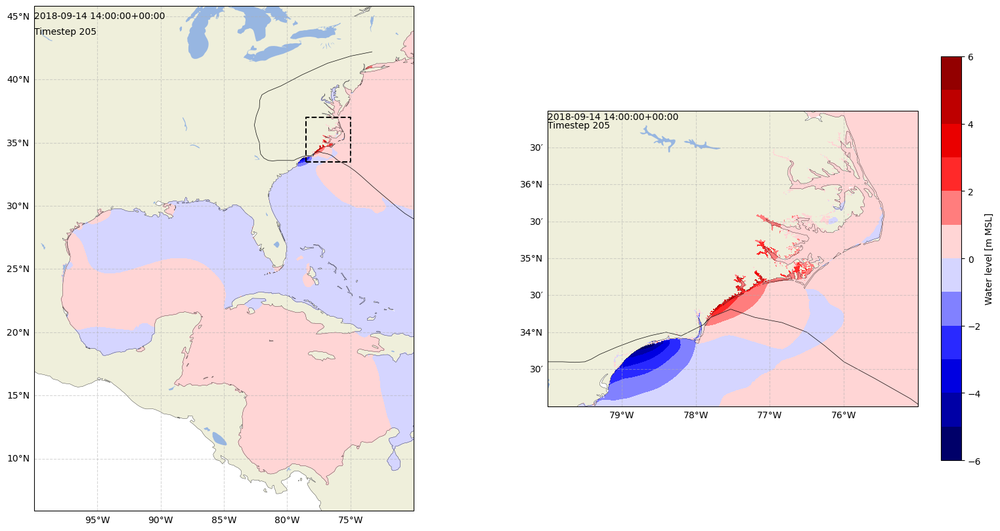

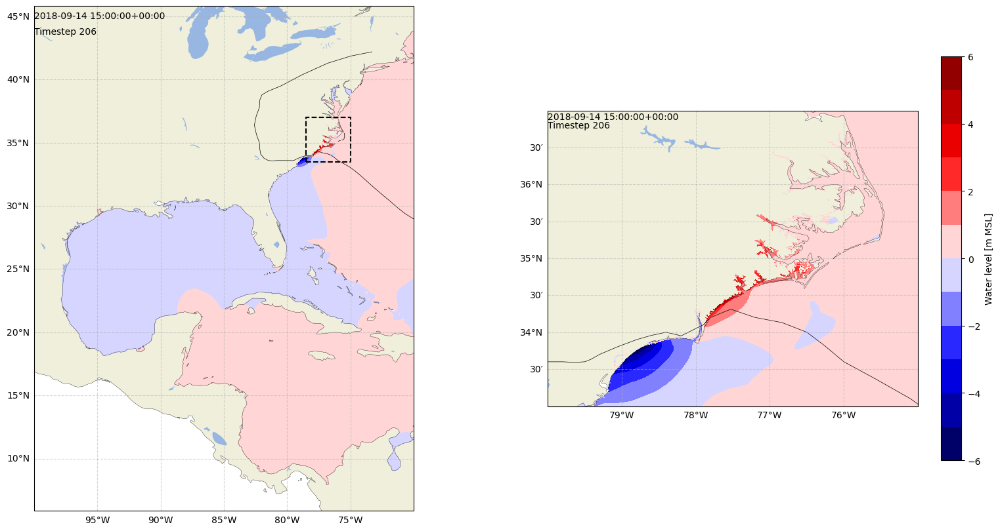

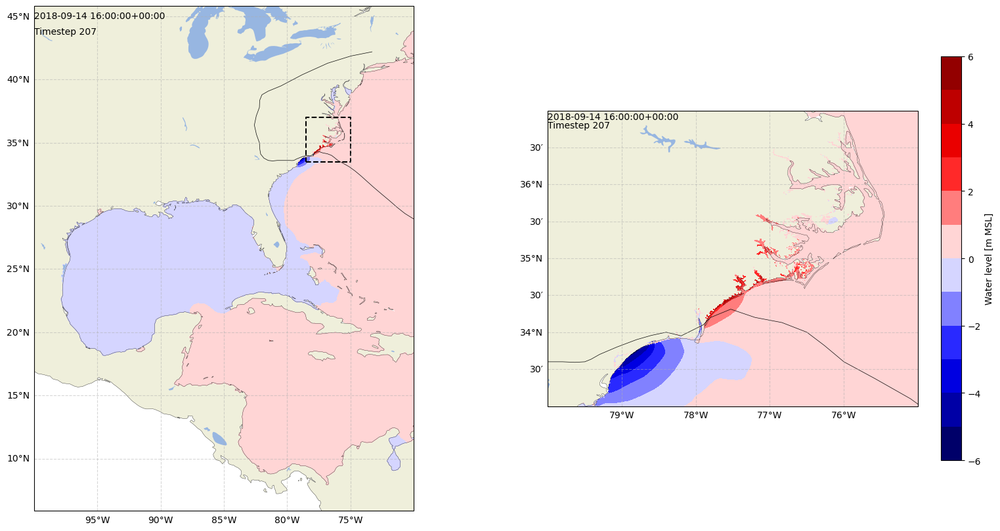

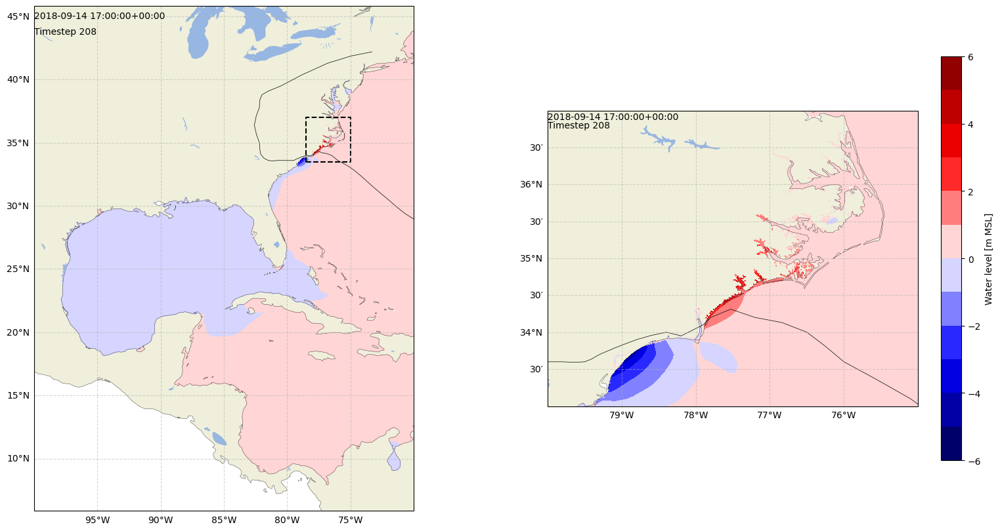

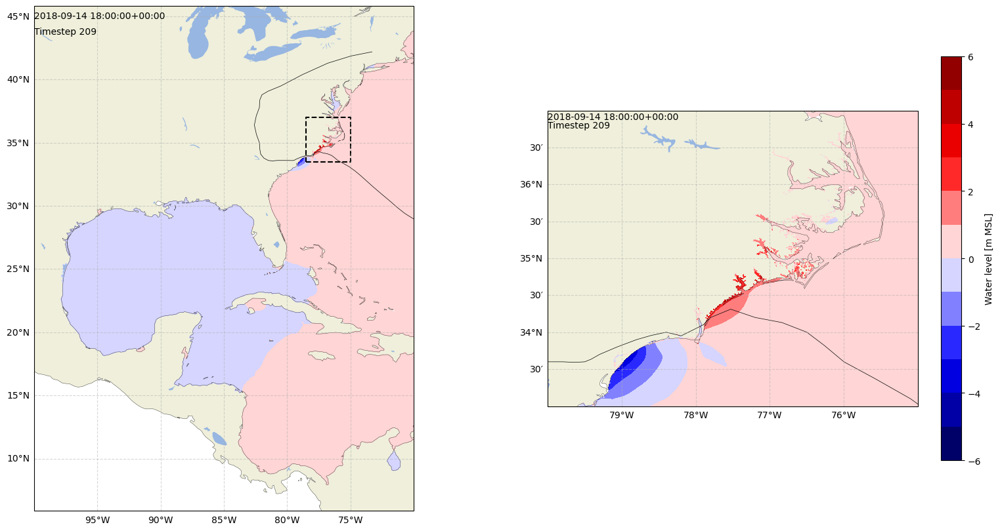

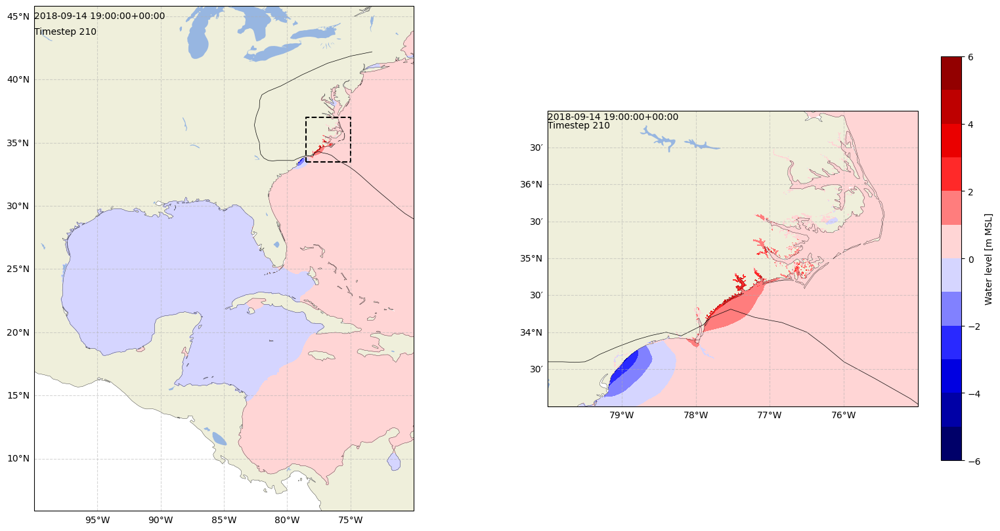

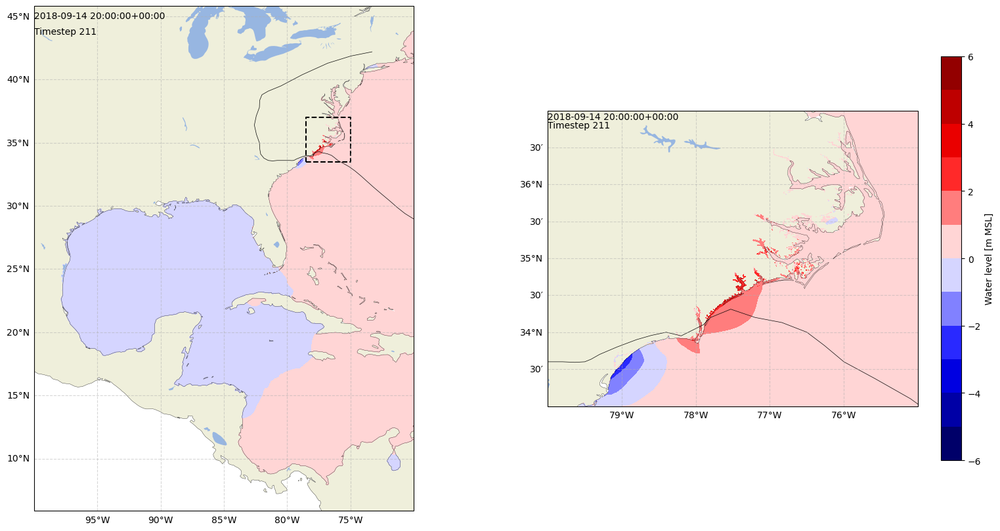

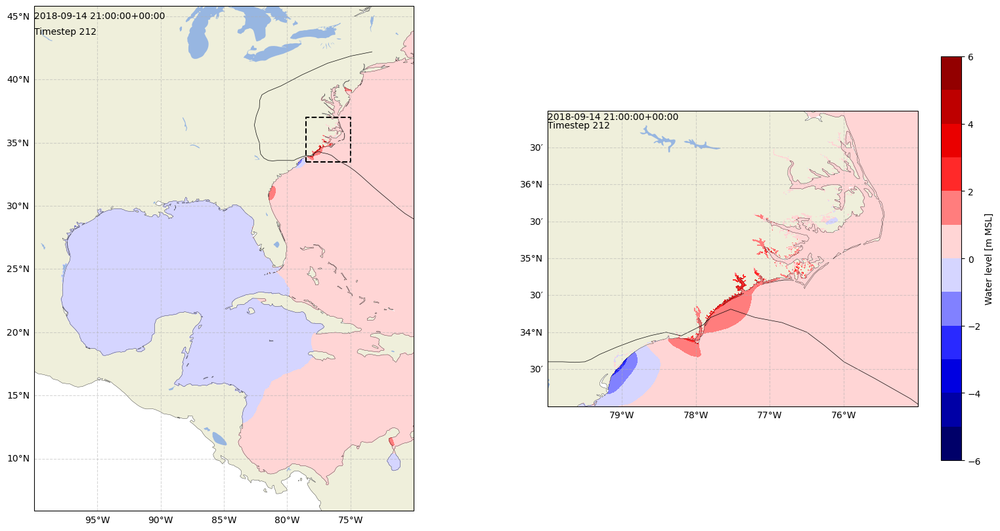

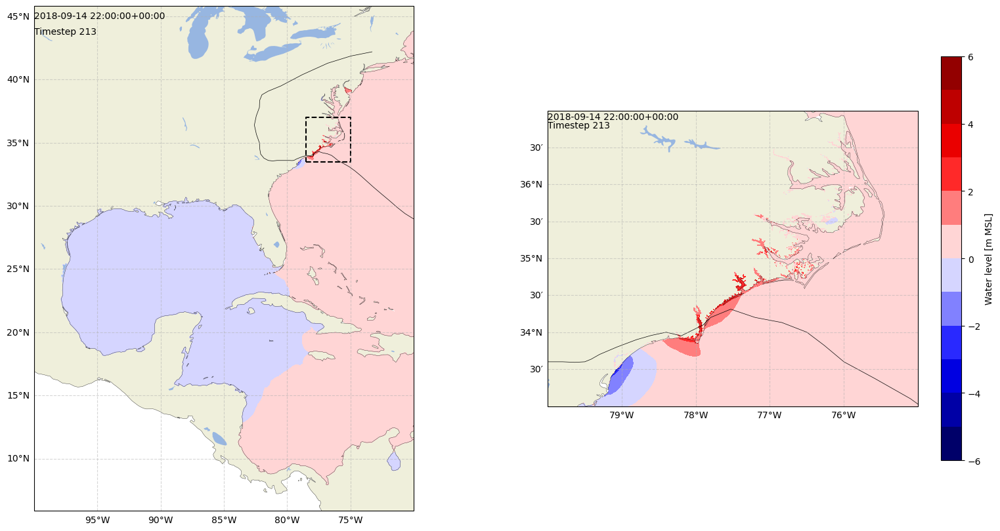

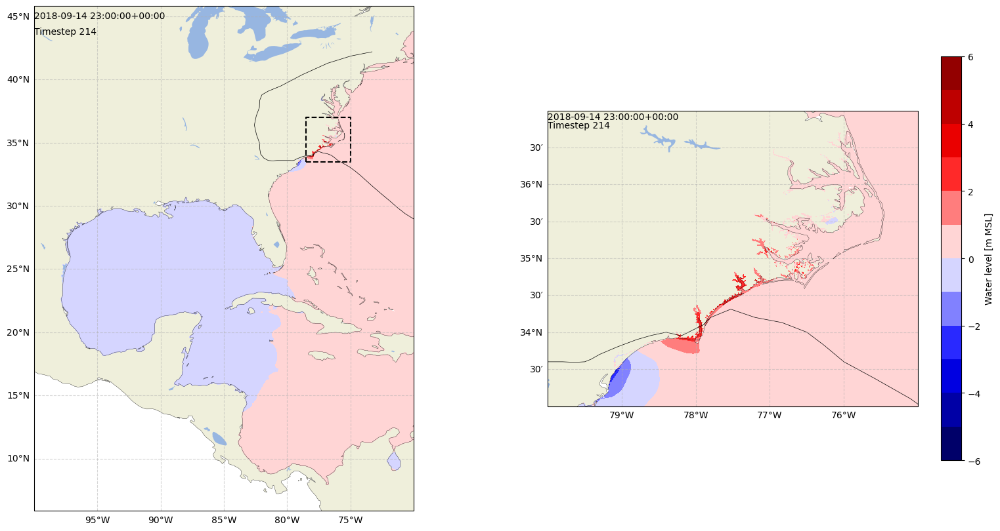

In [40]:
run = runs[1]
track = tracks[run.upper()]
track['max_sustained_wind_ms'] = [x/1.94384 for x in track['max_sustained_wind']]
track['cat'] = [ssScale(x) for x in track['max_sustained_wind_ms'].values]

nc1 = netcdf.Dataset(pathin/run/'fort.63.nc', 'r')
nc2 = netcdf.Dataset(pathin/run/'fort.74.nc', 'r')

ts = list(range(nc1['time'].size))
dates = [pd.to_datetime(nc1['time'].base_date) + pd.Timedelta(seconds = x) for x in nc1['time'][:]]

for t in tqdm(ts[-10:]):

        fig, axs = plt.subplots(ncols = 2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize = (20, 10))

        plot2D(nc1, 'zeta', np.arange(-6, 7, 1), ts = t, cbar = False,
                        cmap = 'seismic', background_map=True, ax = axs[0])
        axs[0].plot([-78.5, -75, -75, -78.5, -78.5], [33.5, 33.5, 37, 37, 33.5], ls = '--', c = 'k')

        axs[0].plot(track['lon'].values, track['lat'].values, color = 'k', lw = 0.5)
        axs[0].set_xlim([-100, -70])
        plot2D(nc1, 'zeta', np.arange(-6, 7, 1), ts = t, cbar = True, cb_label = 'Water level [m MSL]',
                        cmap = 'seismic', background_map=True, xlims = [-80, -75], ylims = [33, 37],
                        ax = axs[1], fig = fig, cb_shrink = 0.8)
        axs[1].plot(track['lon'].values, track['lat'].values, color = 'k', lw = 0.5)

100%|██████████| 10/10 [01:14<00:00,  7.48s/it]


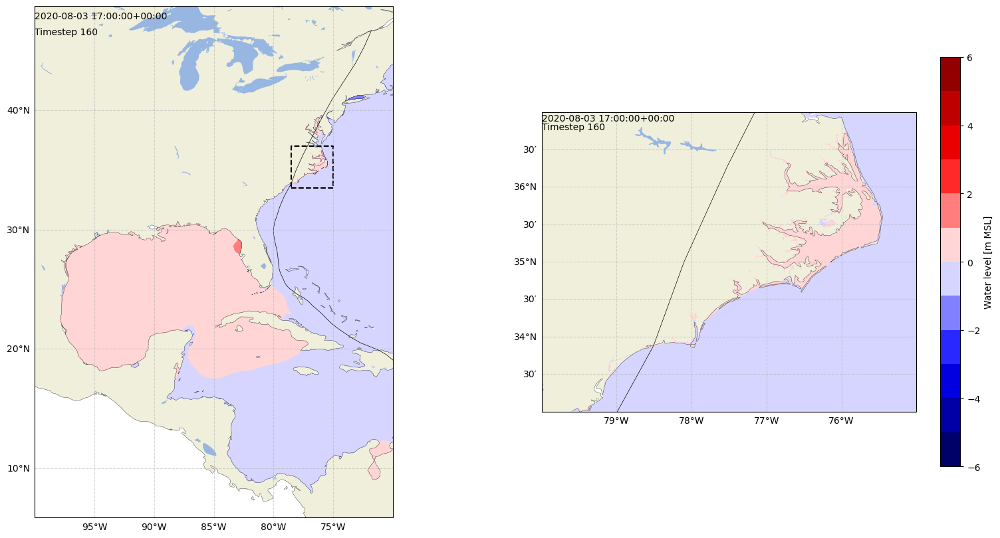

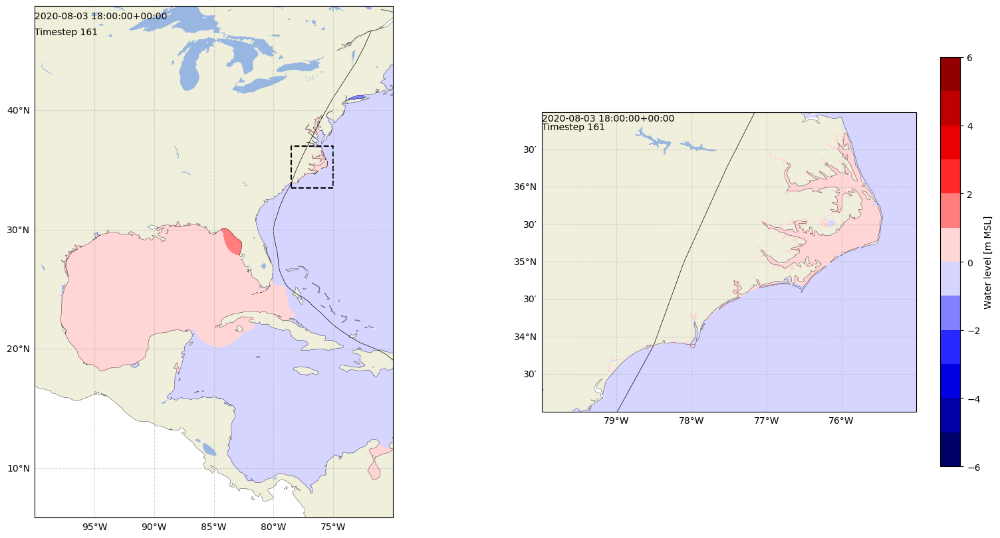

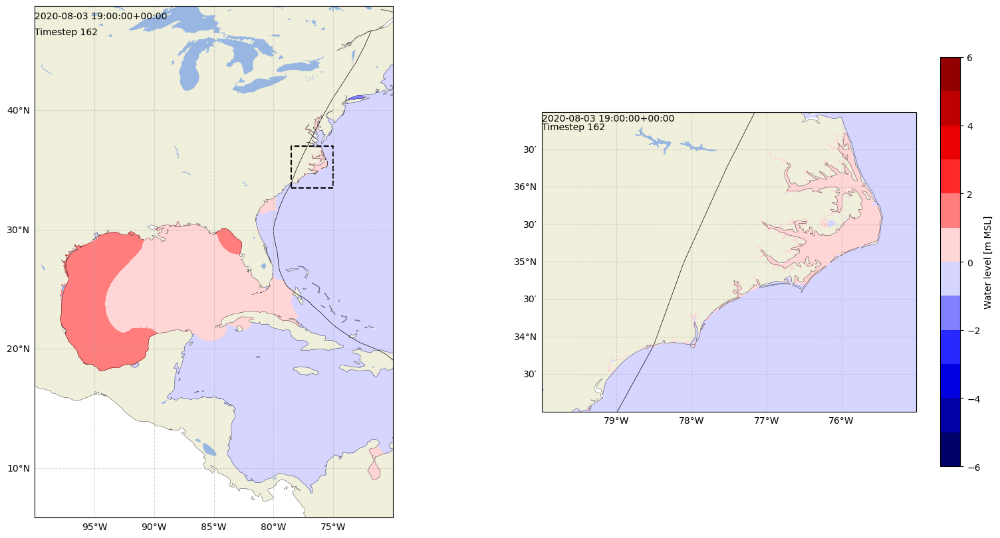

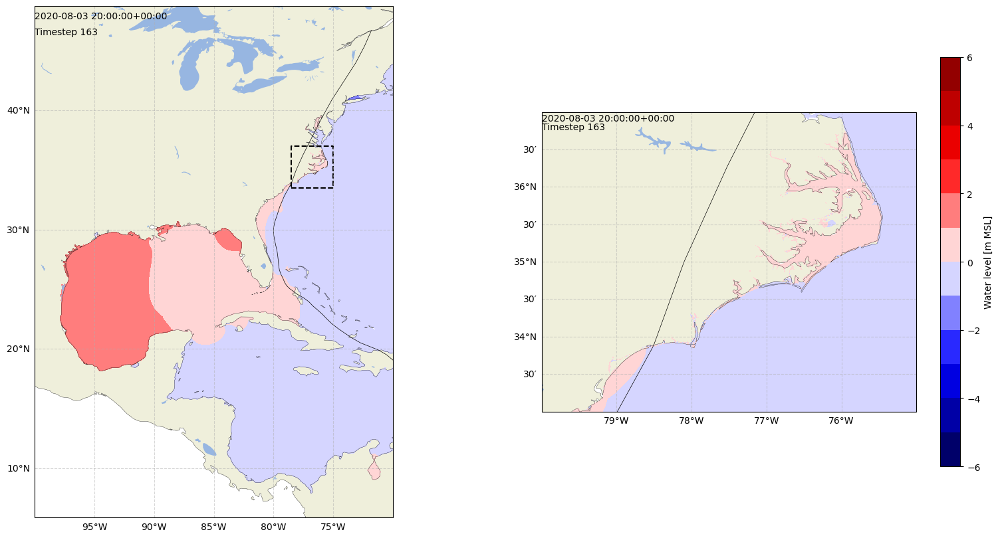

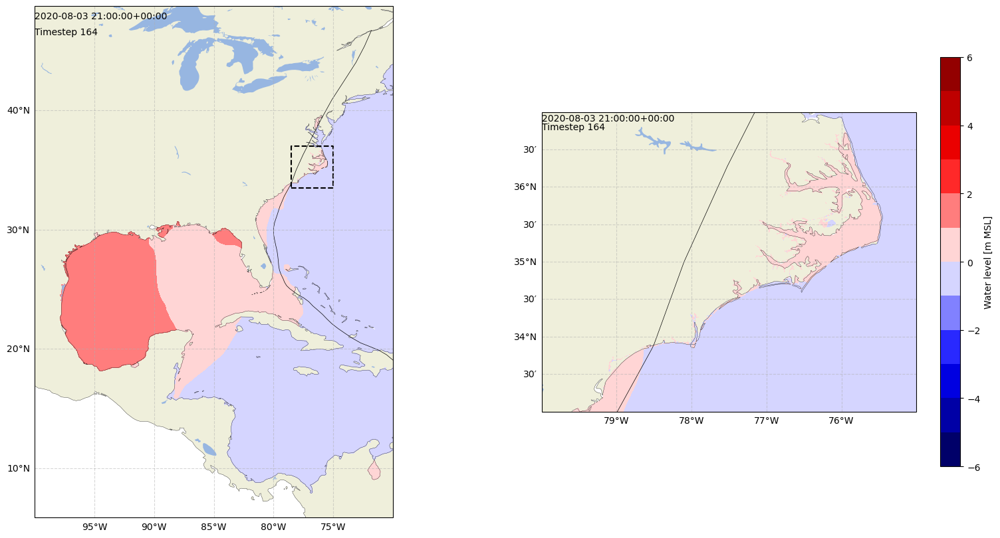

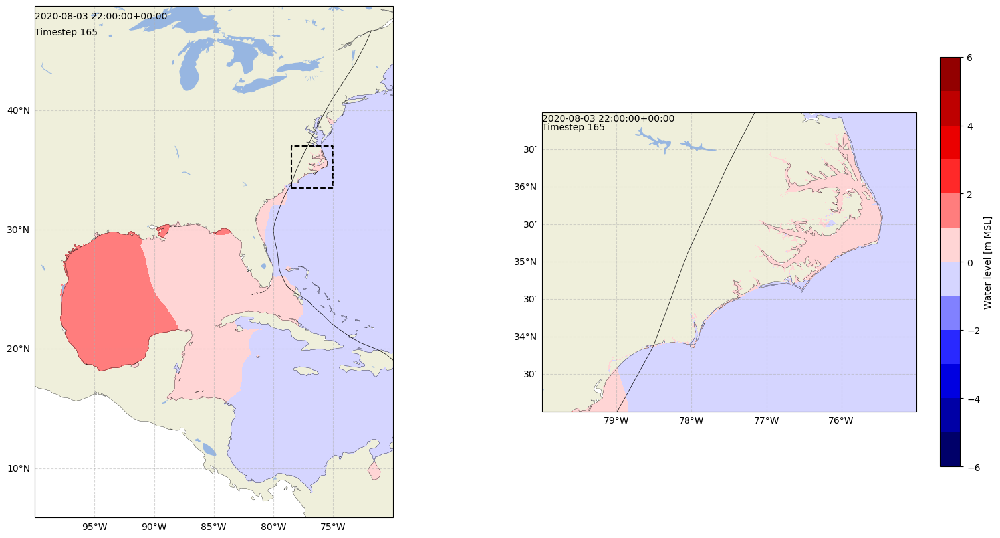

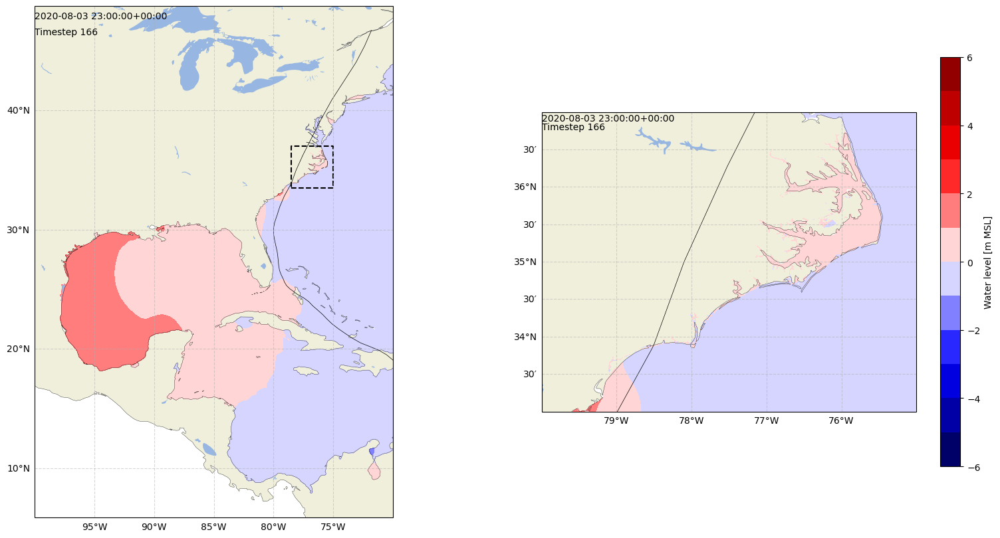

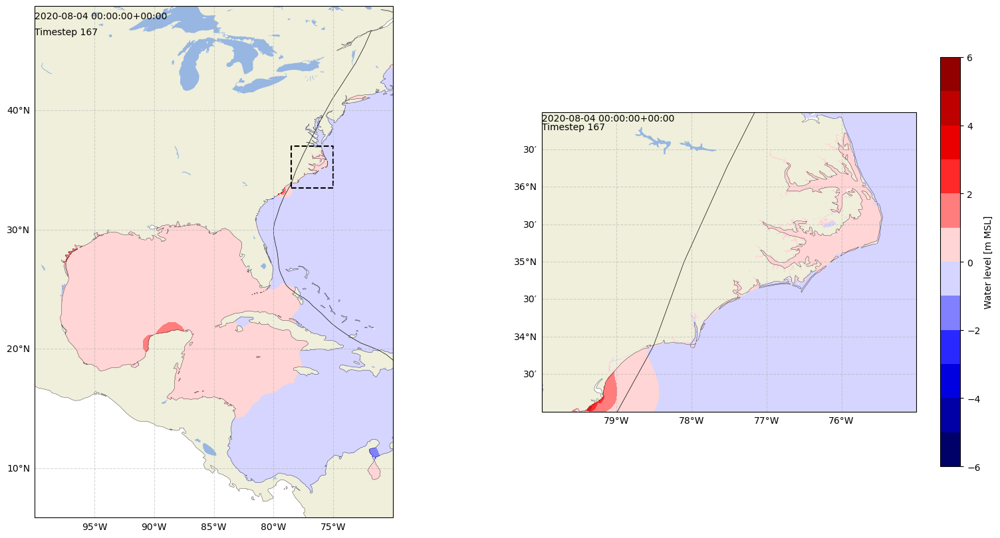

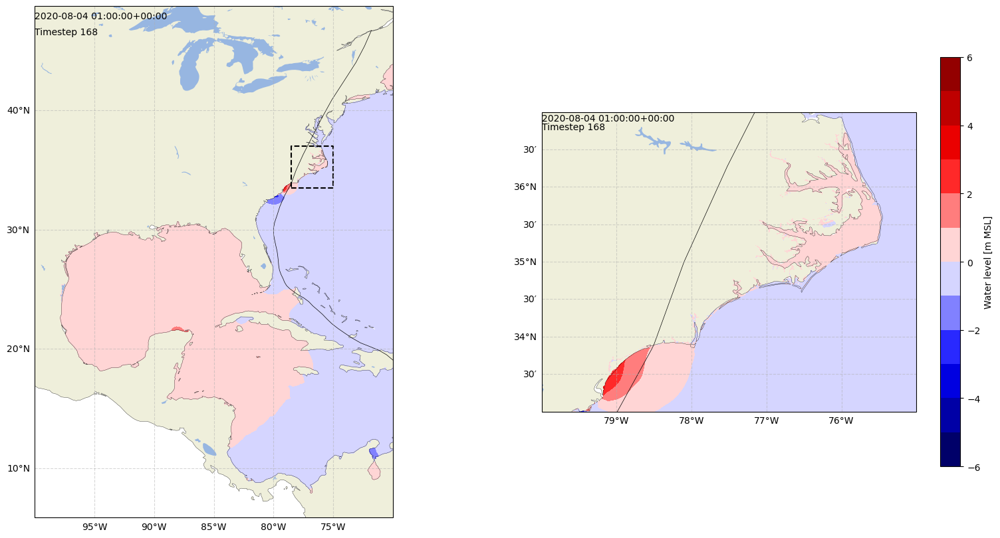

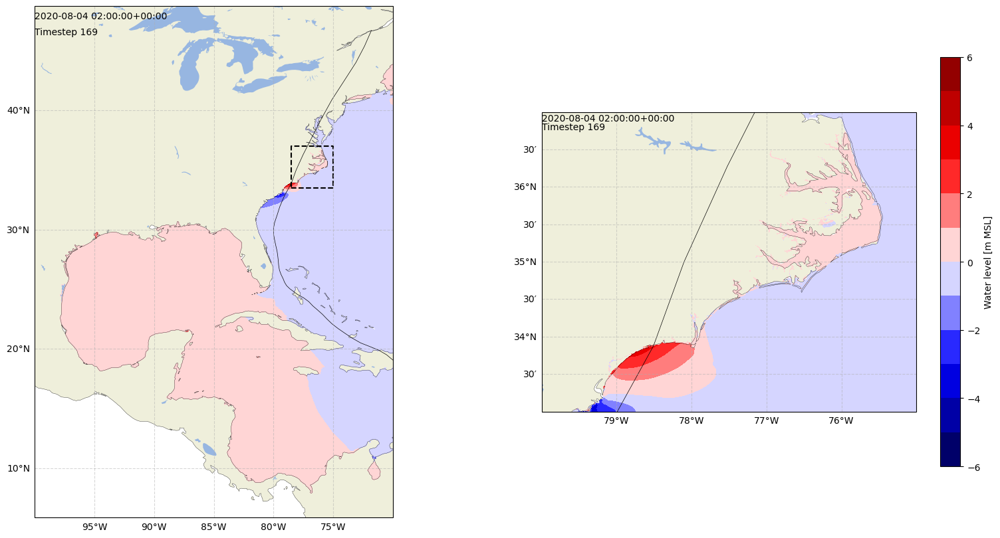

In [42]:
run = runs[2]
track = tracks[run.upper()]
track['max_sustained_wind_ms'] = [x/1.94384 for x in track['max_sustained_wind']]
track['cat'] = [ssScale(x) for x in track['max_sustained_wind_ms'].values]

nc1 = netcdf.Dataset(pathin/run/'fort.63.nc', 'r')
nc2 = netcdf.Dataset(pathin/run/'fort.74.nc', 'r')

ts = list(range(nc1['time'].size))
dates = [pd.to_datetime(nc1['time'].base_date) + pd.Timedelta(seconds = x) for x in nc1['time'][:]]

for t in tqdm(ts[-10:]):

        fig, axs = plt.subplots(ncols = 2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize = (20, 10))

        plot2D(nc1, 'zeta', np.arange(-6, 7, 1), ts = t, cbar = False,
                        cmap = 'seismic', background_map=True, ax = axs[0])
        axs[0].plot([-78.5, -75, -75, -78.5, -78.5], [33.5, 33.5, 37, 37, 33.5], ls = '--', c = 'k')

        axs[0].plot(track['lon'].values, track['lat'].values, color = 'k', lw = 0.5)
        axs[0].set_xlim([-100, -70])
        plot2D(nc1, 'zeta', np.arange(-6, 7, 1), ts = t, cbar = True, cb_label = 'Water level [m MSL]',
                        cmap = 'seismic', background_map=True, xlims = [-80, -75], ylims = [33, 37],
                        ax = axs[1], fig = fig, cb_shrink = 0.8)
        axs[1].plot(track['lon'].values, track['lat'].values, color = 'k', lw = 0.5)

  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [01:16<00:00,  7.69s/it]


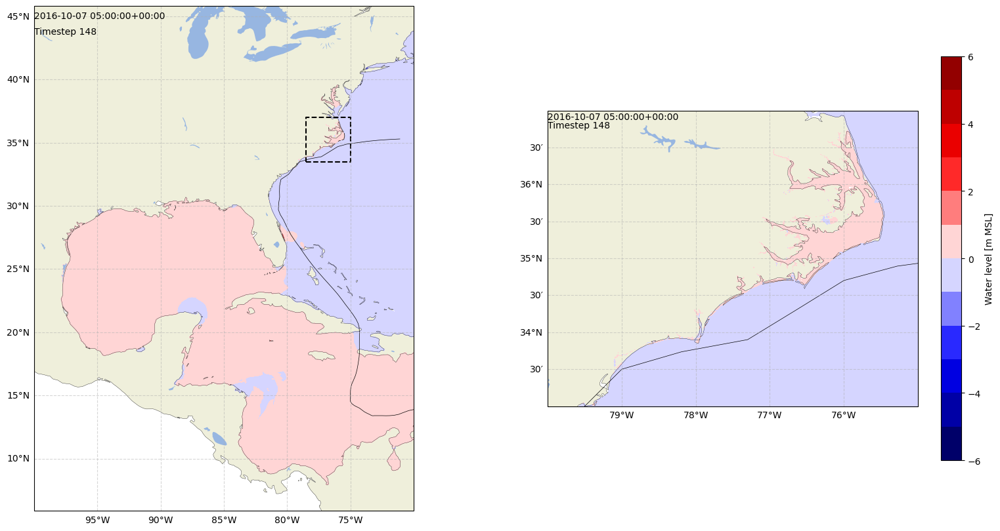

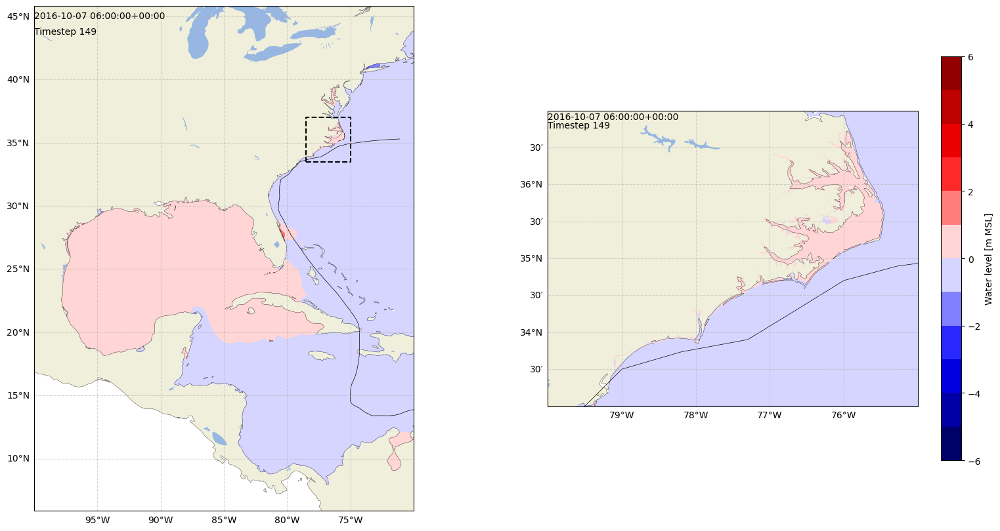

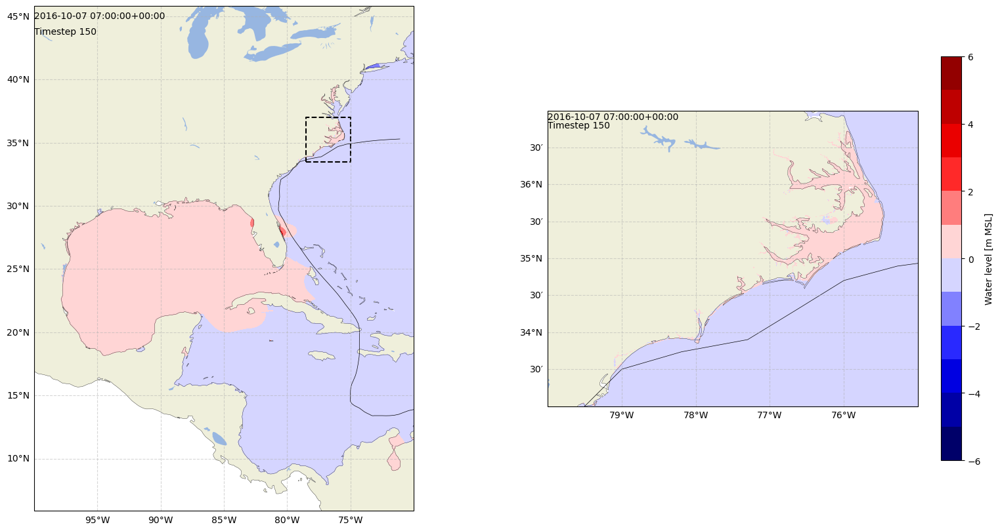

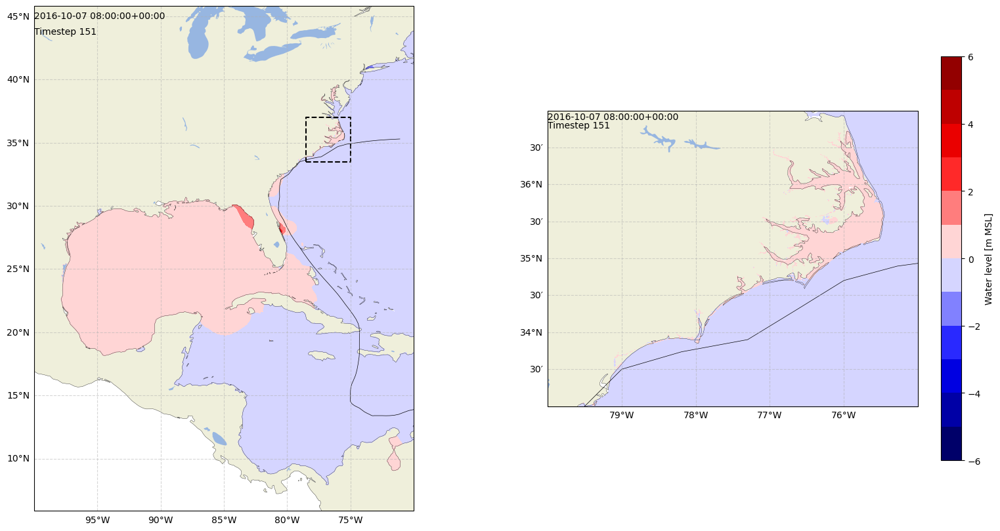

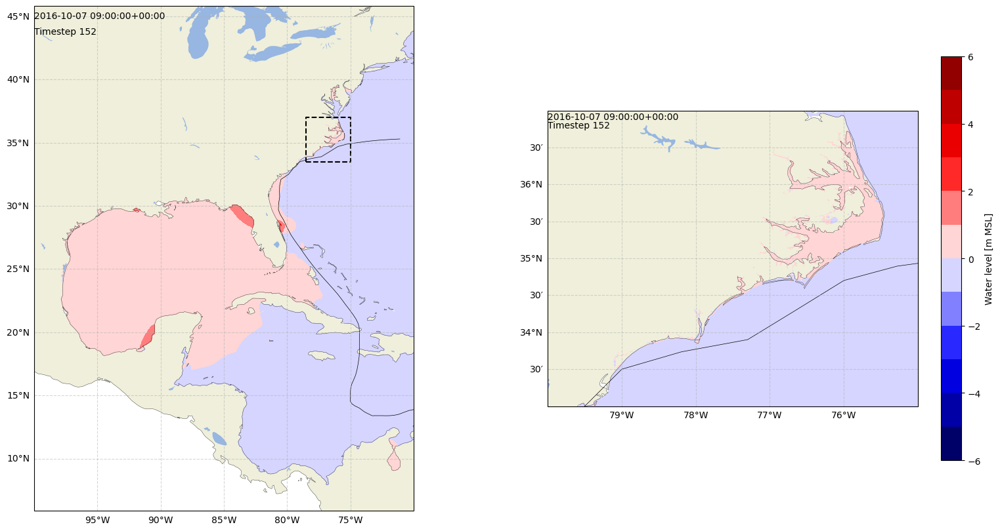

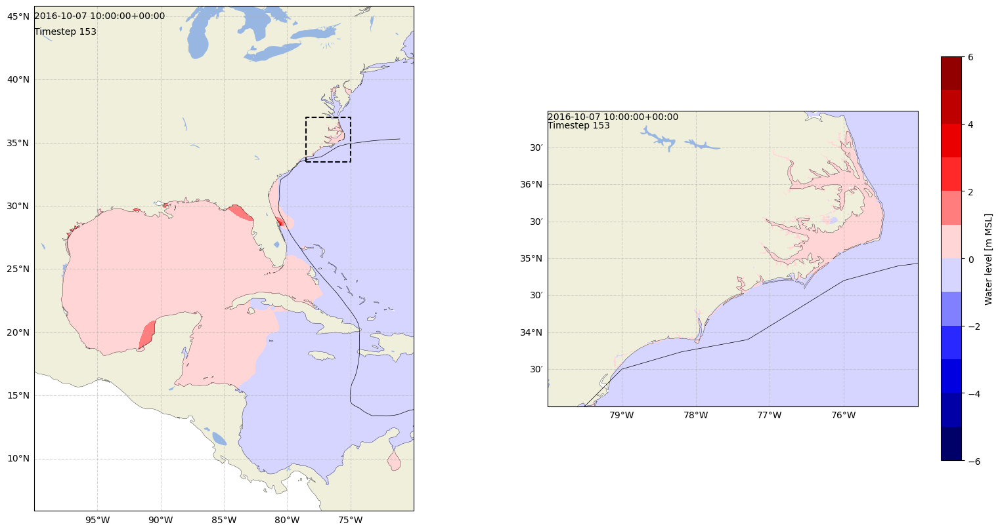

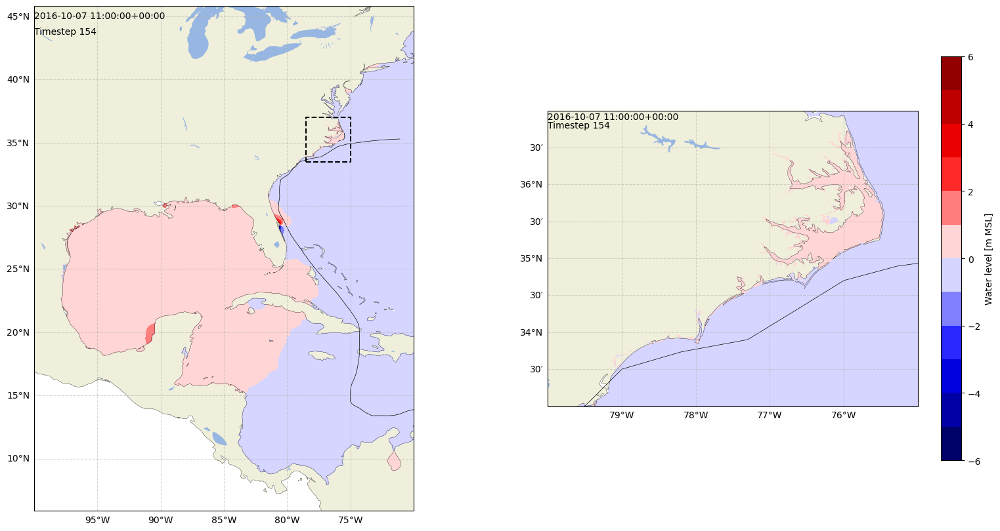

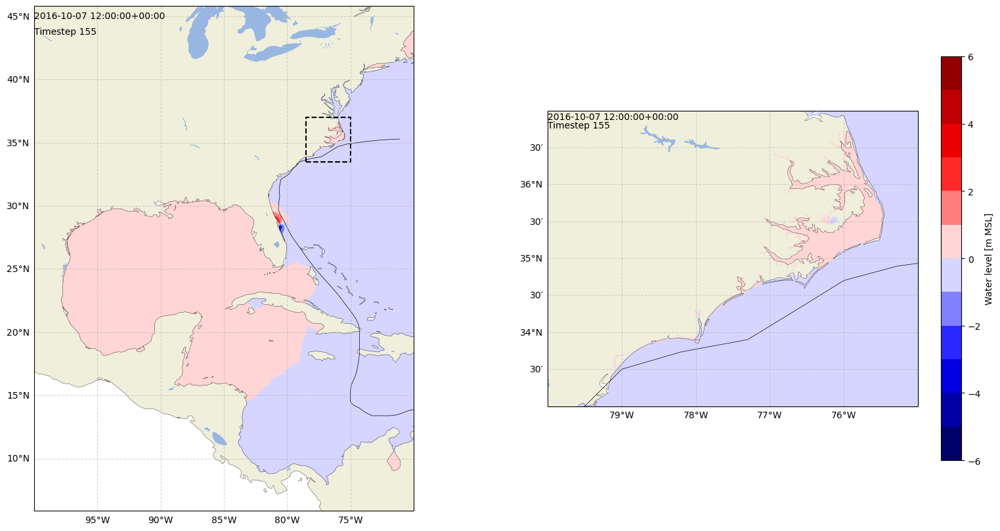

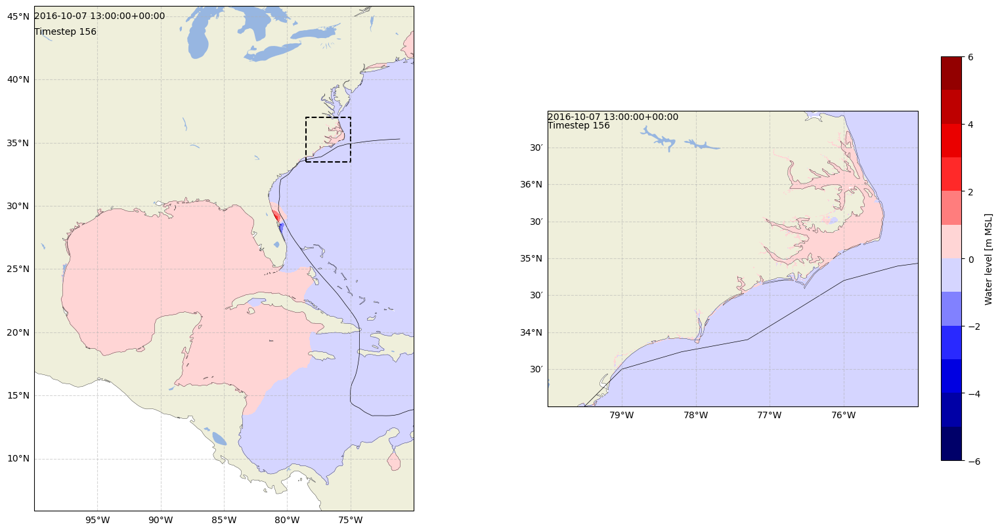

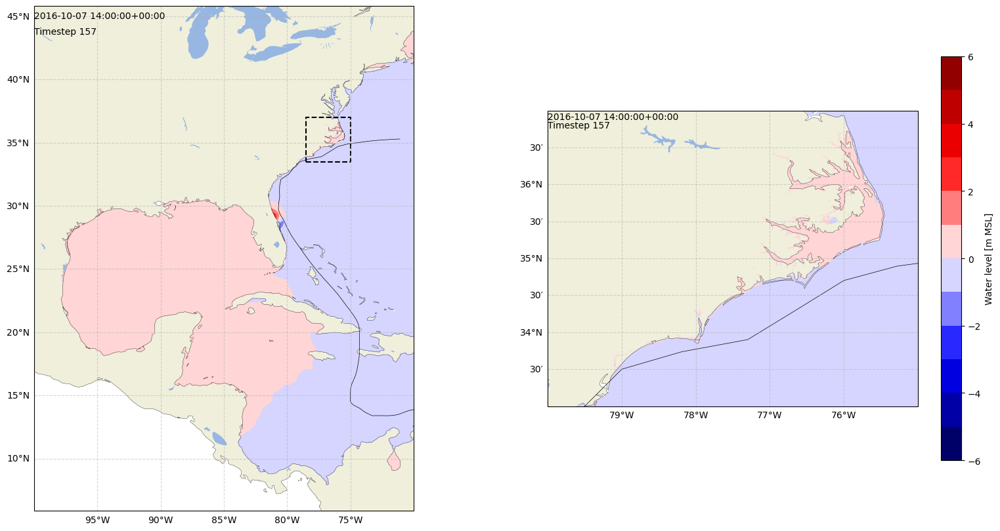

In [44]:
run = runs[3]
track = tracks[run.upper()]
track['max_sustained_wind_ms'] = [x/1.94384 for x in track['max_sustained_wind']]
track['cat'] = [ssScale(x) for x in track['max_sustained_wind_ms'].values]

nc1 = netcdf.Dataset(pathin/run/'fort.63.nc', 'r')
nc2 = netcdf.Dataset(pathin/run/'fort.74.nc', 'r')

ts = list(range(nc1['time'].size))
dates = [pd.to_datetime(nc1['time'].base_date) + pd.Timedelta(seconds = x) for x in nc1['time'][:]]

for t in tqdm(ts[-10:]):

        fig, axs = plt.subplots(ncols = 2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize = (20, 10))

        plot2D(nc1, 'zeta', np.arange(-6, 7, 1), ts = t, cbar = False,
                        cmap = 'seismic', background_map=True, ax = axs[0])
        axs[0].plot([-78.5, -75, -75, -78.5, -78.5], [33.5, 33.5, 37, 37, 33.5], ls = '--', c = 'k')

        axs[0].plot(track['lon'].values, track['lat'].values, color = 'k', lw = 0.5)
        axs[0].set_xlim([-100, -70])
        plot2D(nc1, 'zeta', np.arange(-6, 7, 1), ts = t, cbar = True, cb_label = 'Water level [m MSL]',
                        cmap = 'seismic', background_map=True, xlims = [-80, -75], ylims = [33, 37],
                        ax = axs[1], fig = fig, cb_shrink = 0.8)
        axs[1].plot(track['lon'].values, track['lat'].values, color = 'k', lw = 0.5)

  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [01:13<00:00,  7.31s/it]


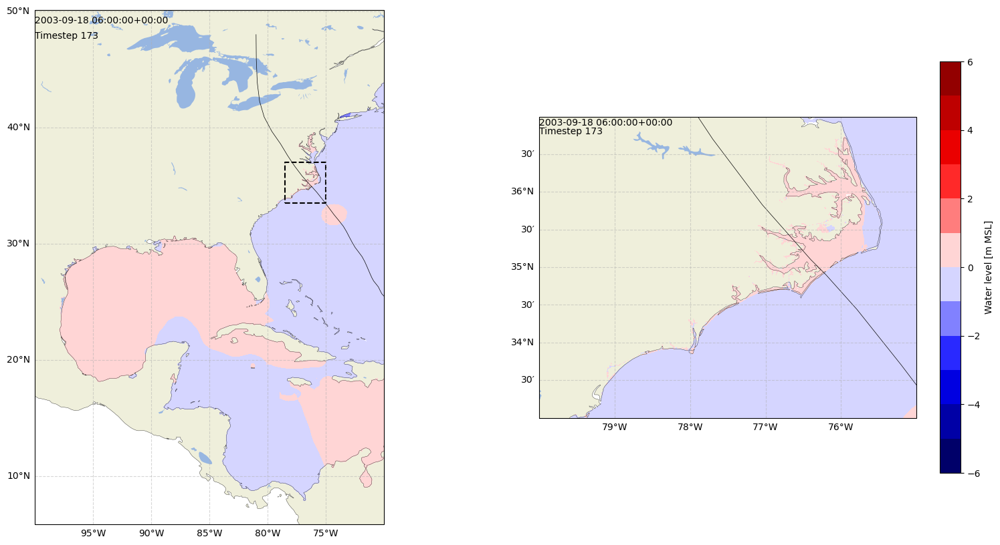

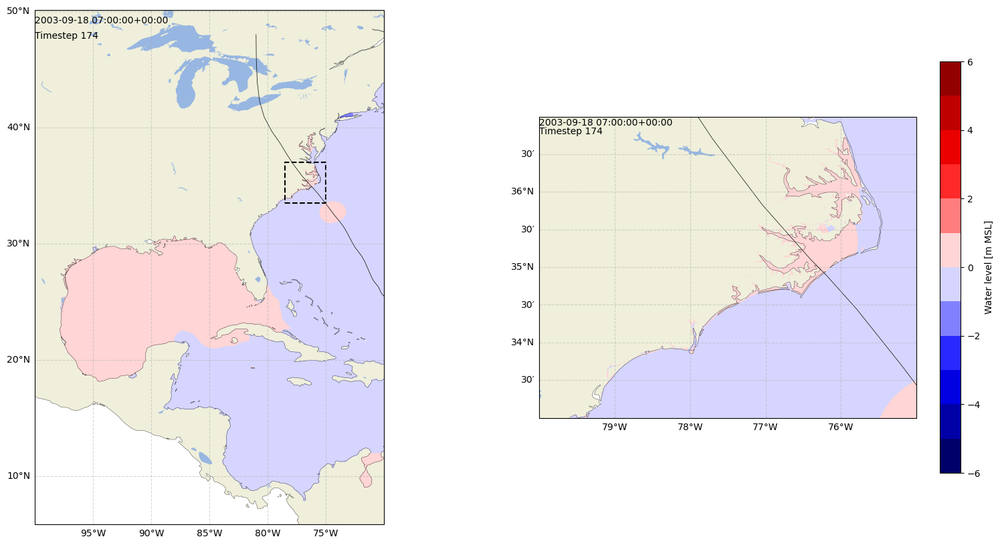

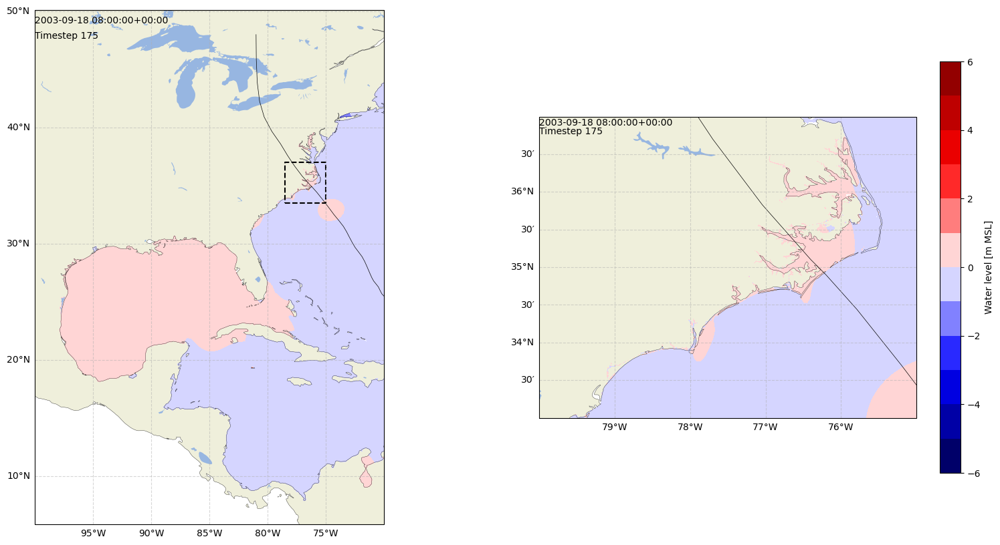

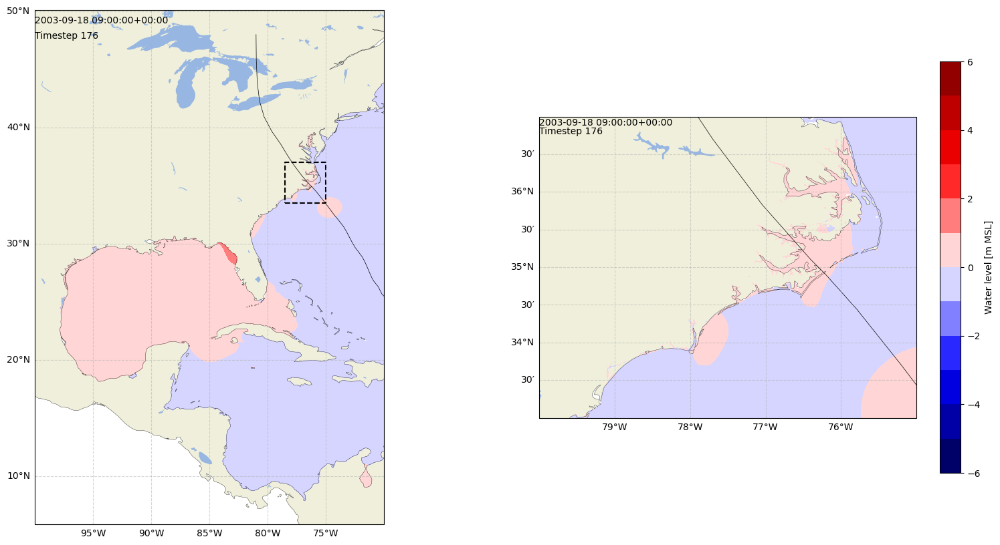

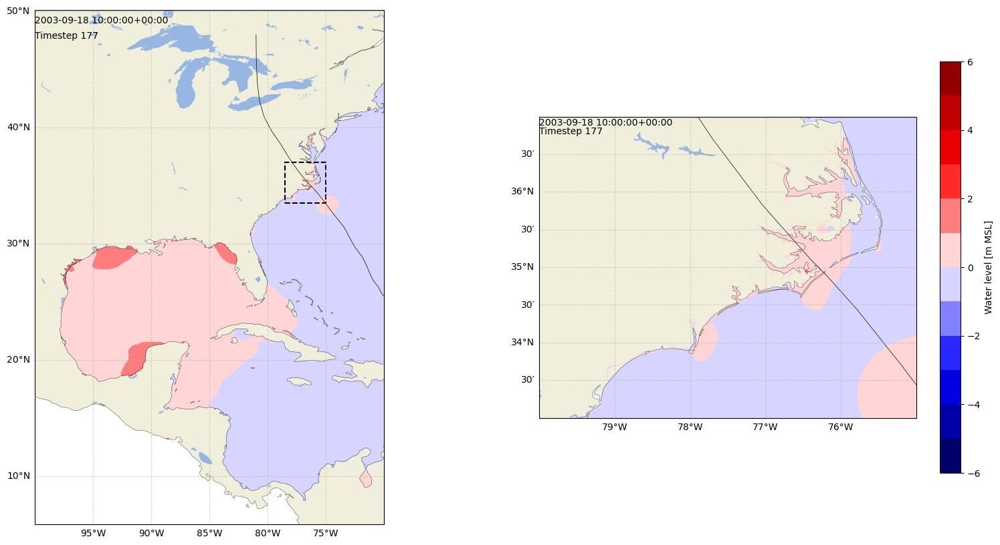

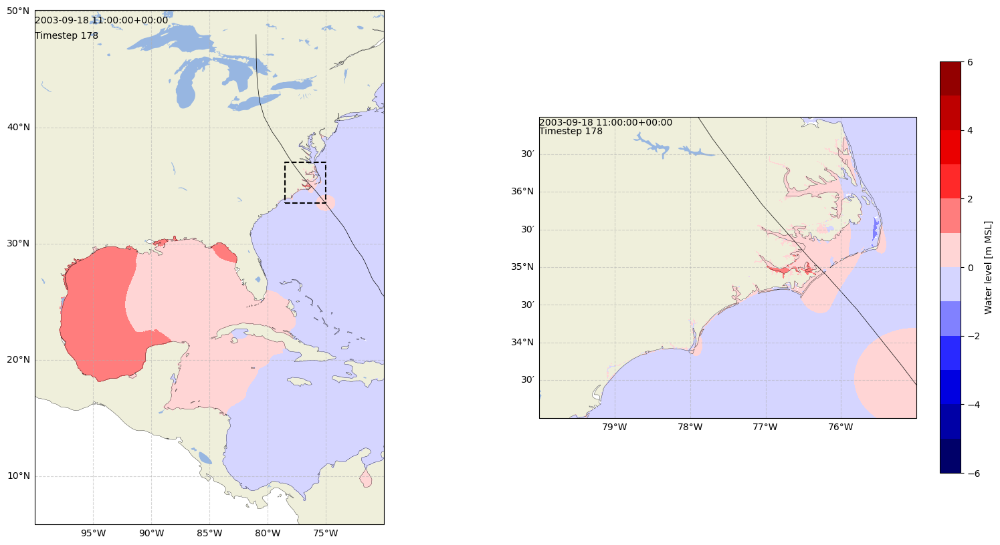

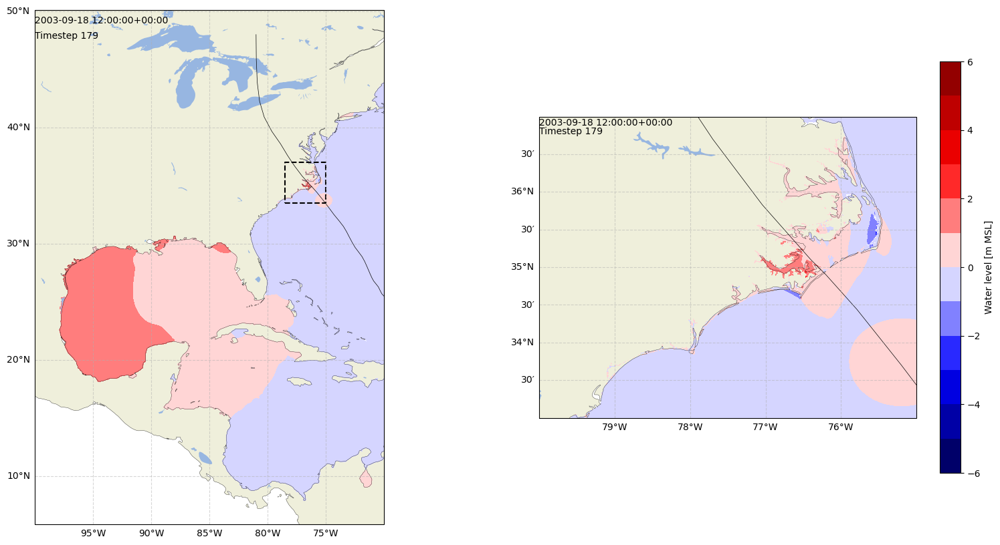

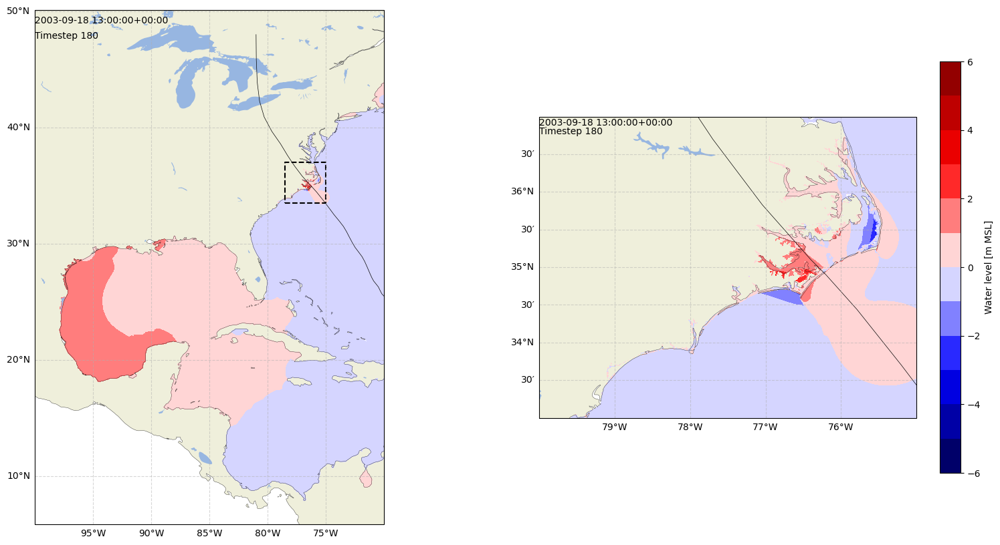

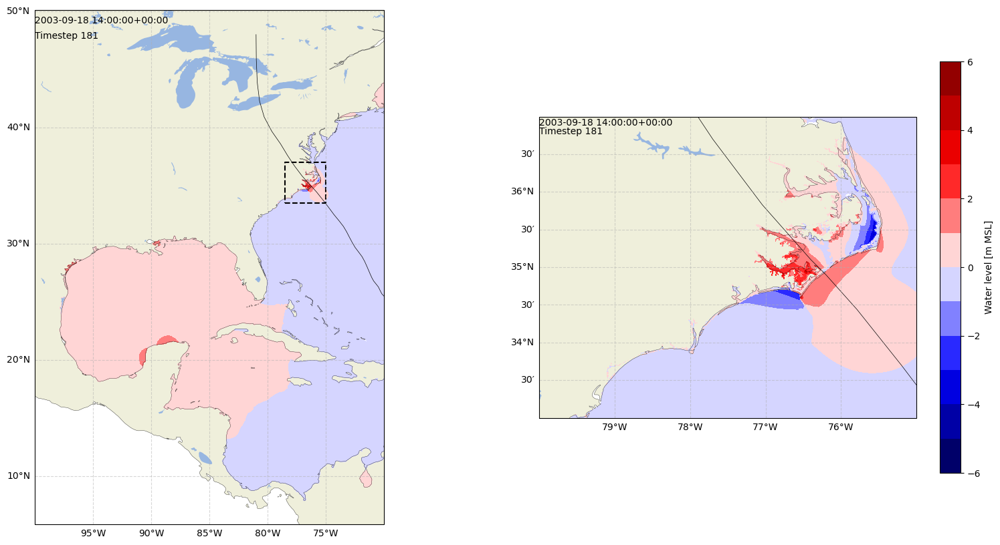

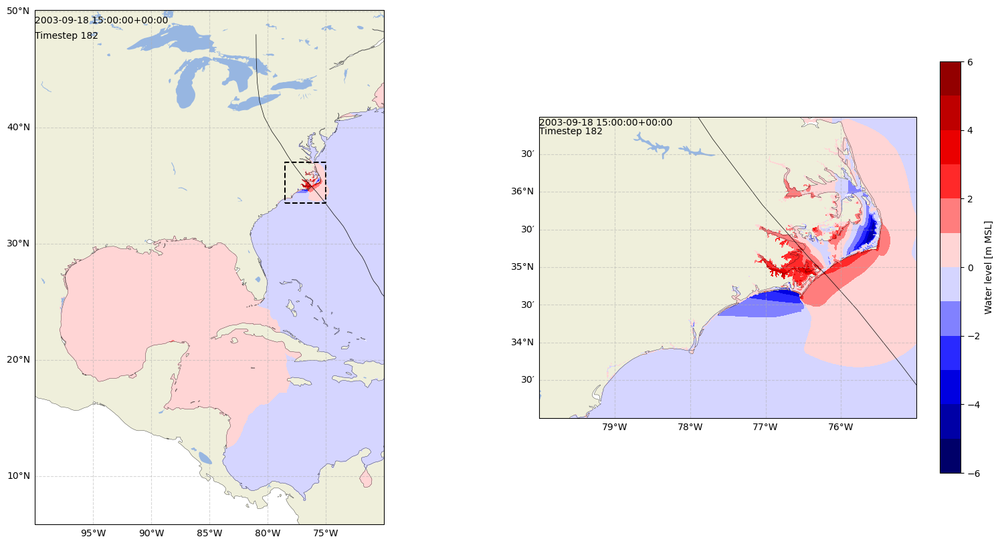

In [46]:
run = runs[4]
track = tracks[run.upper()]
track['max_sustained_wind_ms'] = [x/1.94384 for x in track['max_sustained_wind']]
track['cat'] = [ssScale(x) for x in track['max_sustained_wind_ms'].values]

nc1 = netcdf.Dataset(pathin/run/'fort.63.nc', 'r')
nc2 = netcdf.Dataset(pathin/run/'fort.74.nc', 'r')

ts = list(range(nc1['time'].size))
dates = [pd.to_datetime(nc1['time'].base_date) + pd.Timedelta(seconds = x) for x in nc1['time'][:]]

for t in tqdm(ts[-10:]):

        fig, axs = plt.subplots(ncols = 2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize = (20, 10))

        plot2D(nc1, 'zeta', np.arange(-6, 7, 1), ts = t, cbar = False,
                        cmap = 'seismic', background_map=True, ax = axs[0])
        axs[0].plot([-78.5, -75, -75, -78.5, -78.5], [33.5, 33.5, 37, 37, 33.5], ls = '--', c = 'k')

        axs[0].plot(track['lon'].values, track['lat'].values, color = 'k', lw = 0.5)
        axs[0].set_xlim([-100, -70])
        plot2D(nc1, 'zeta', np.arange(-6, 7, 1), ts = t, cbar = True, cb_label = 'Water level [m MSL]',
                        cmap = 'seismic', background_map=True, xlims = [-80, -75], ylims = [33, 37],
                        ax = axs[1], fig = fig, cb_shrink = 0.8)
        axs[1].plot(track['lon'].values, track['lat'].values, color = 'k', lw = 0.5)

#### 03c

In [53]:
pathin = Path(r'../models/adcirc//concorde/batch02/_results/03c')
runs = os.listdir(pathin)

In [54]:
runs

['Dorian', 'Matthew']

  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [01:16<00:00,  7.60s/it]


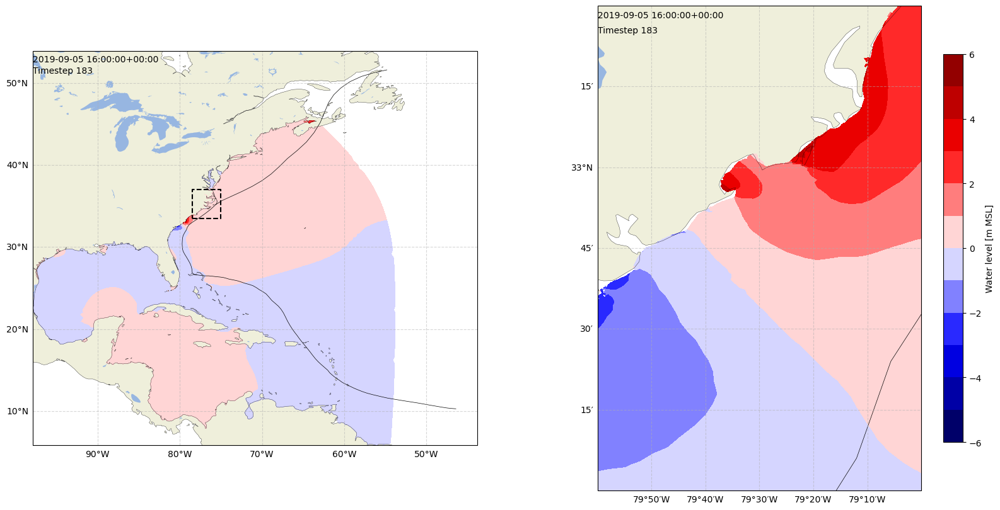

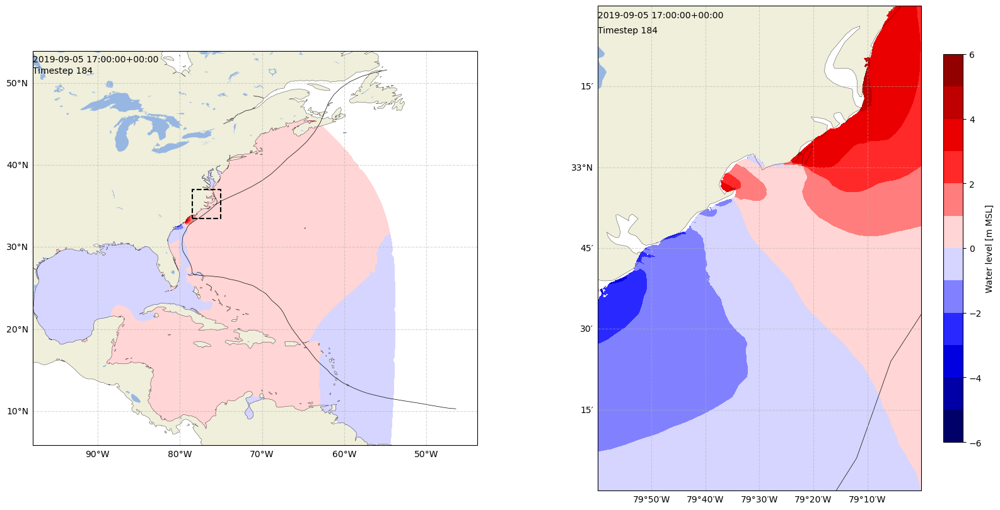

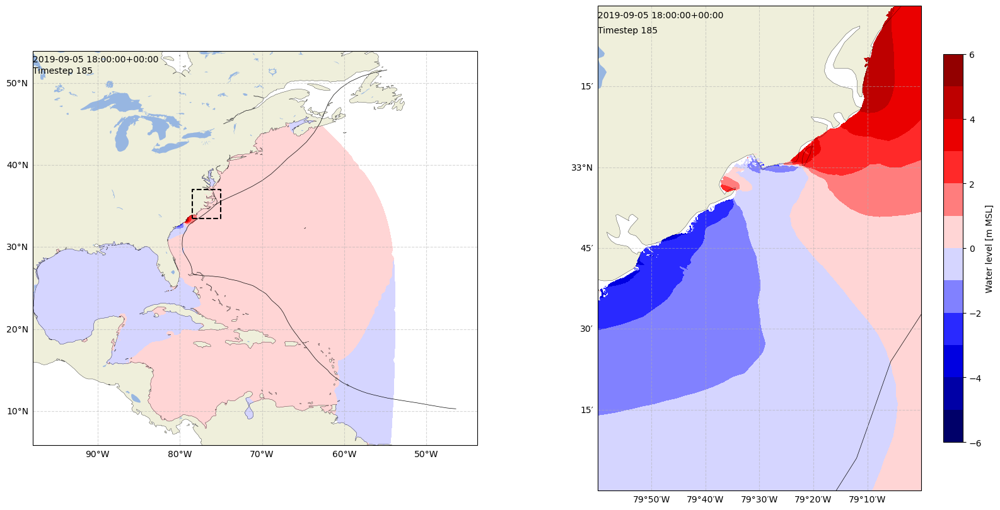

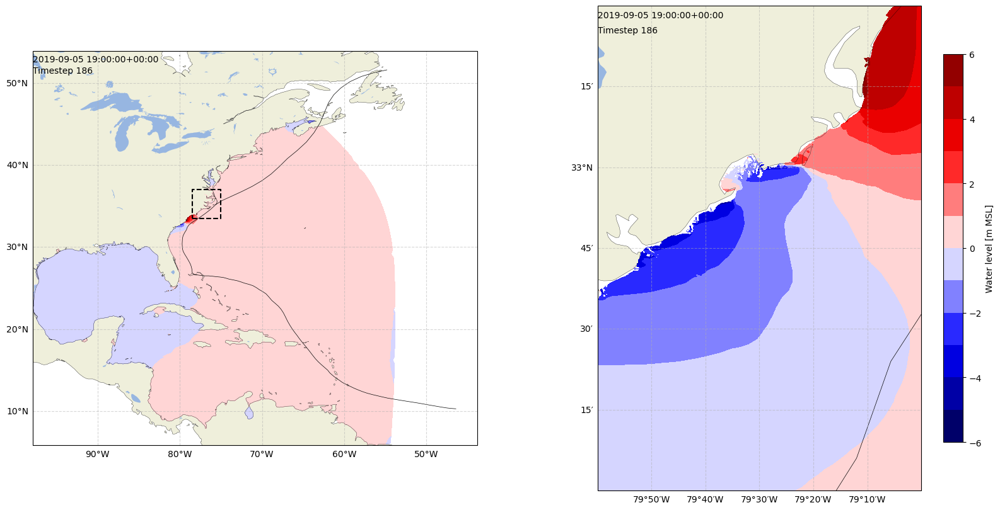

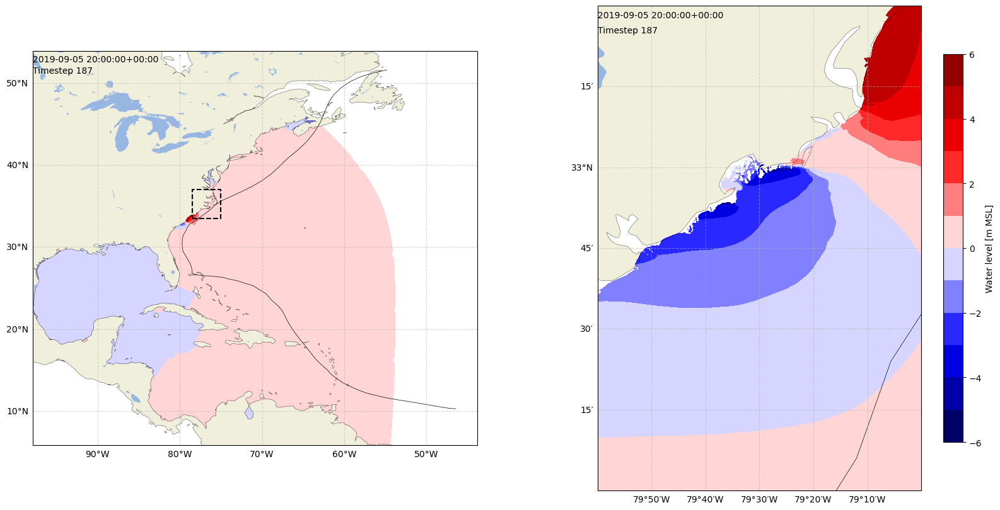

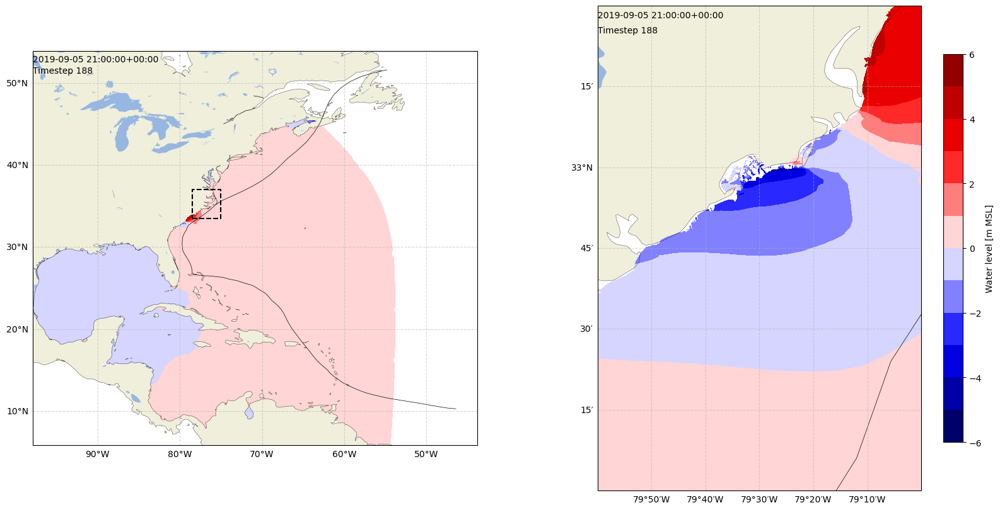

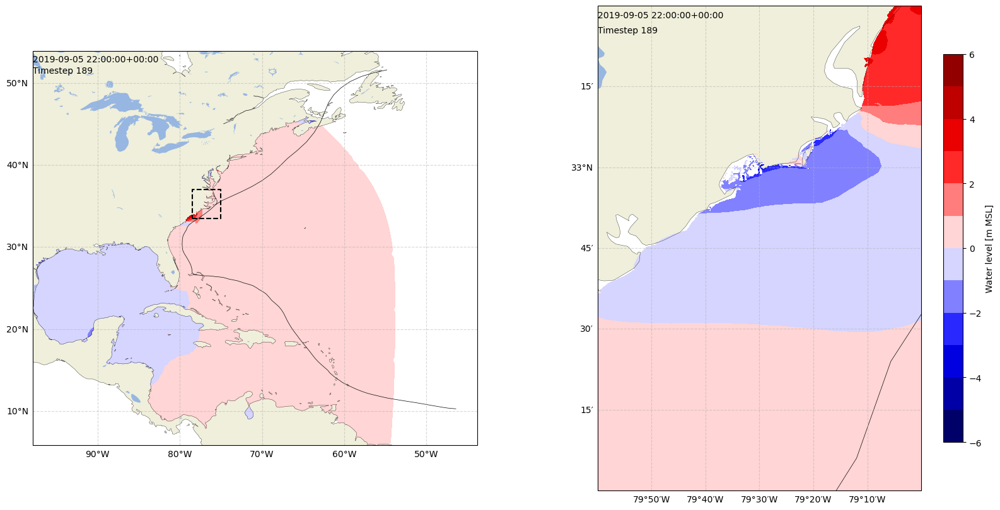

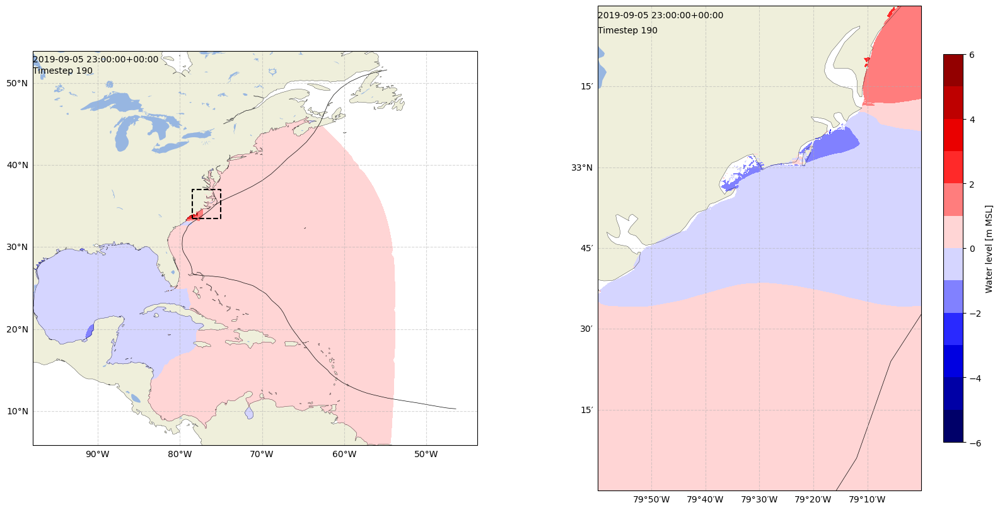

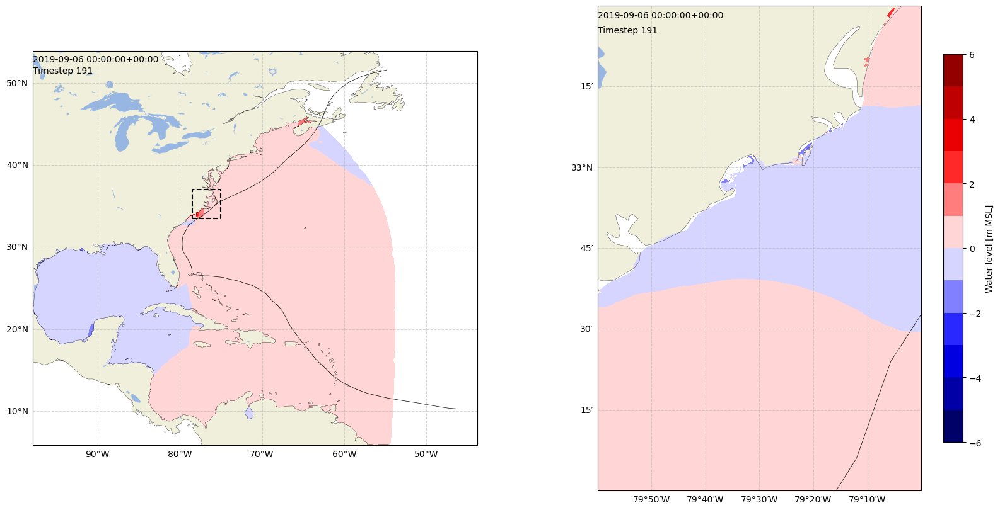

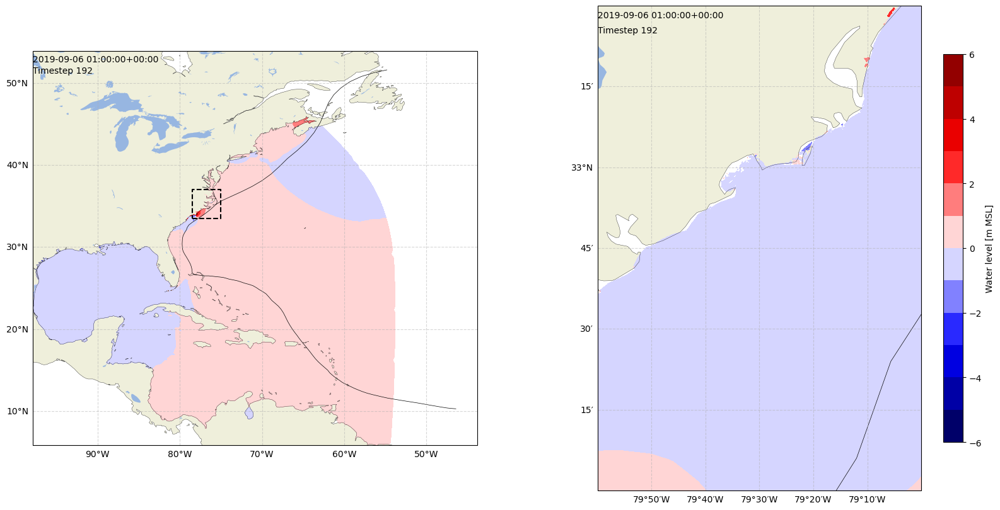

In [55]:
run = runs[0]
track = tracks[run.upper()]
track['max_sustained_wind_ms'] = [x/1.94384 for x in track['max_sustained_wind']]
track['cat'] = [ssScale(x) for x in track['max_sustained_wind_ms'].values]

nc1 = netcdf.Dataset(pathin/run/'fort.63.nc', 'r')
nc2 = netcdf.Dataset(pathin/run/'fort.74.nc', 'r')

ts = list(range(nc1['time'].size))
dates = [pd.to_datetime(nc1['time'].base_date) + pd.Timedelta(seconds = x) for x in nc1['time'][:]]

for t in tqdm(ts[-10:]):

        fig, axs = plt.subplots(ncols = 2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize = (20, 10))

        plot2D(nc1, 'zeta', np.arange(-6, 7, 1), ts = t, cbar = False,
                        cmap = 'seismic', background_map=True, ax = axs[0])
        axs[0].plot([-78.5, -75, -75, -78.5, -78.5], [33.5, 33.5, 37, 37, 33.5], ls = '--', c = 'k')
        axs[0].plot(track['lon'].values, track['lat'].values, color = 'k', lw = 0.5)

        plot2D(nc1, 'zeta', np.arange(-6, 7, 1), ts = t, cbar = True, cb_label = 'Water level [m MSL]',
                        cmap = 'seismic', background_map=True, xlims = [-80, -79], ylims = [32, 33.5],
                        ax = axs[1], fig = fig, cb_shrink = 0.8)
        axs[1].plot(track['lon'].values, track['lat'].values, color = 'k', lw = 0.5)

100%|██████████| 10/10 [01:14<00:00,  7.43s/it]


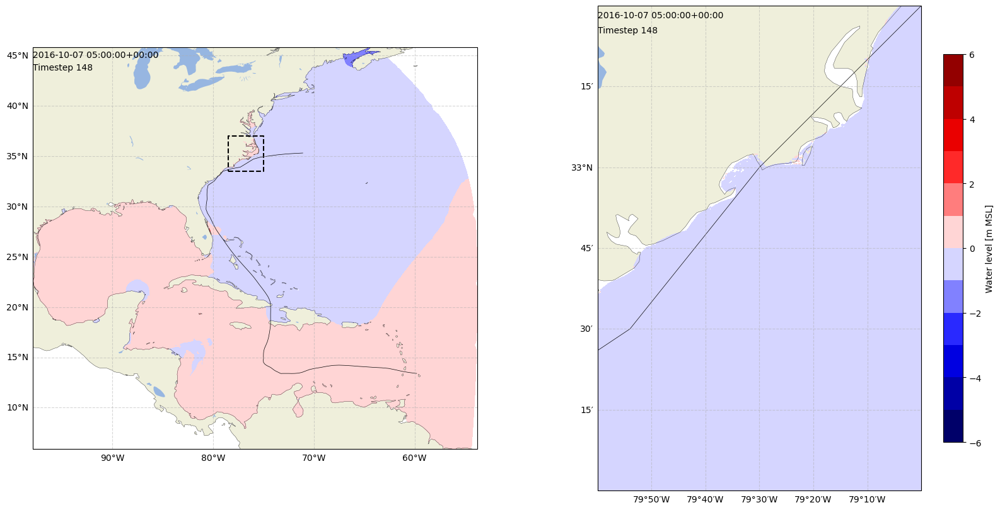

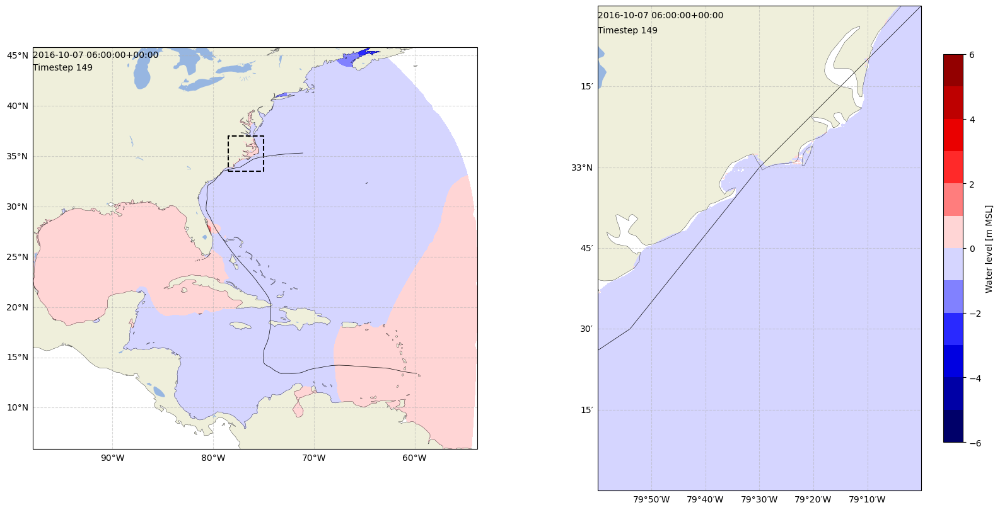

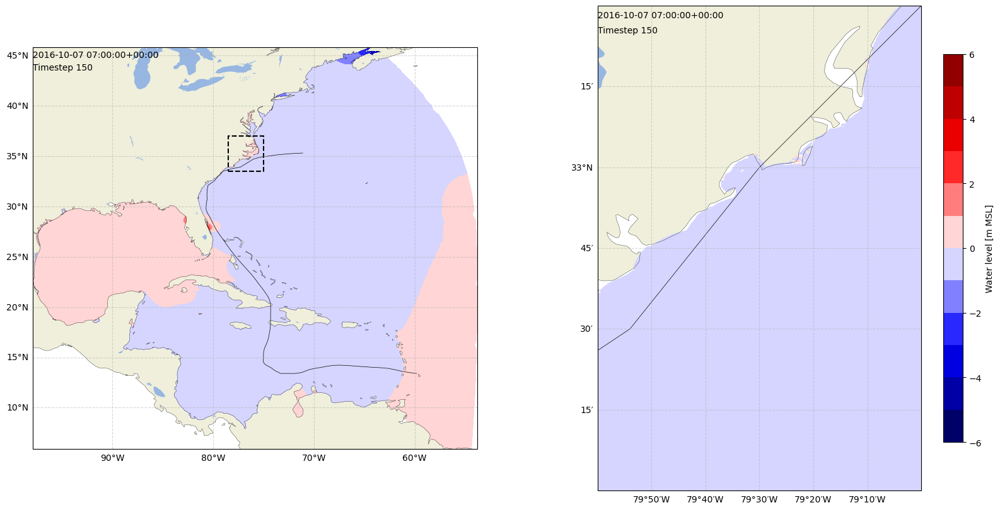

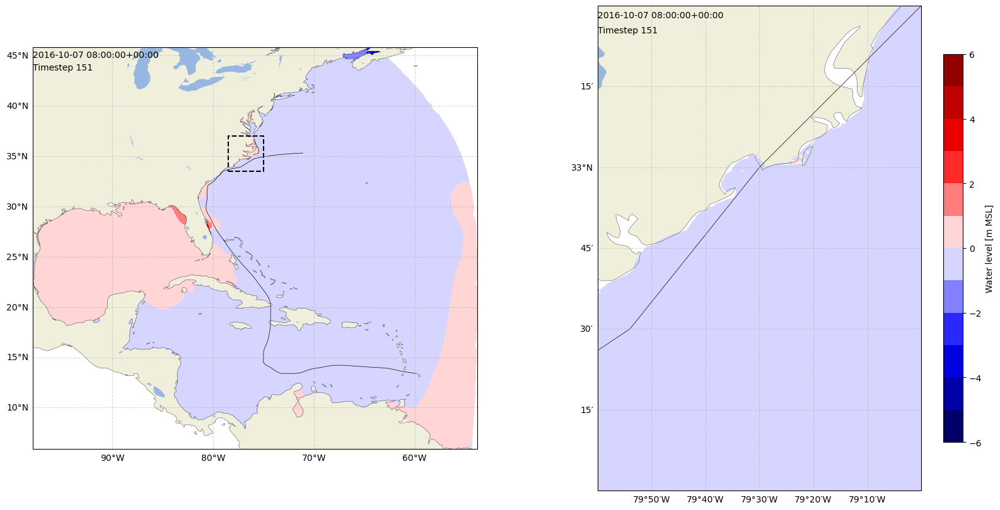

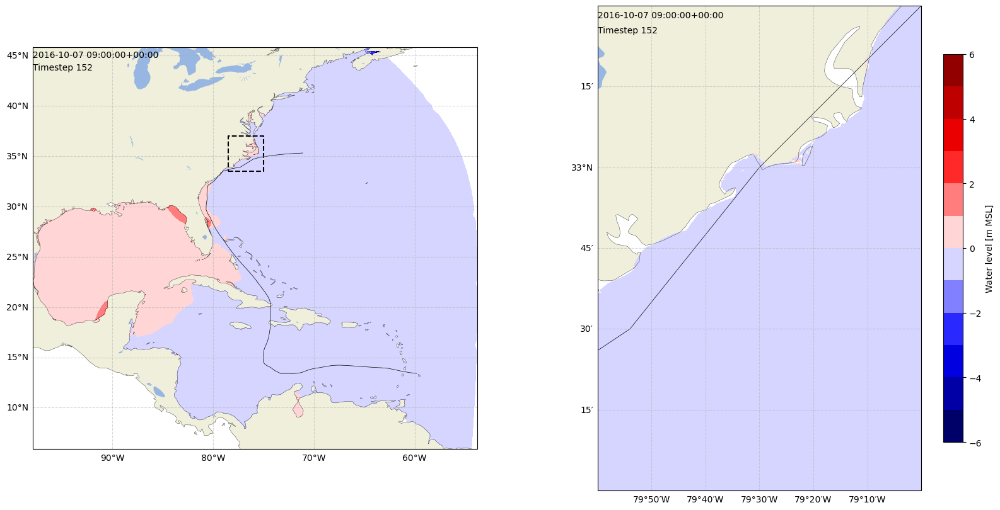

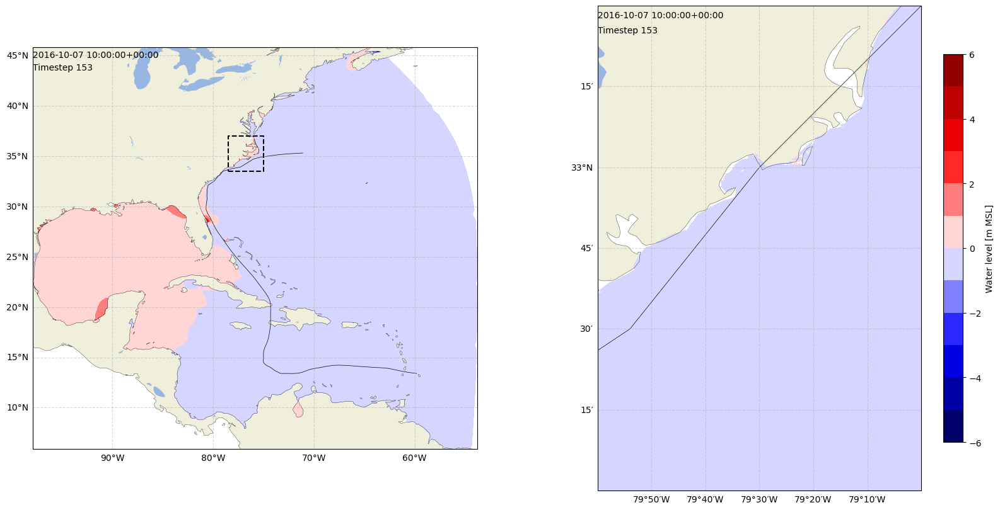

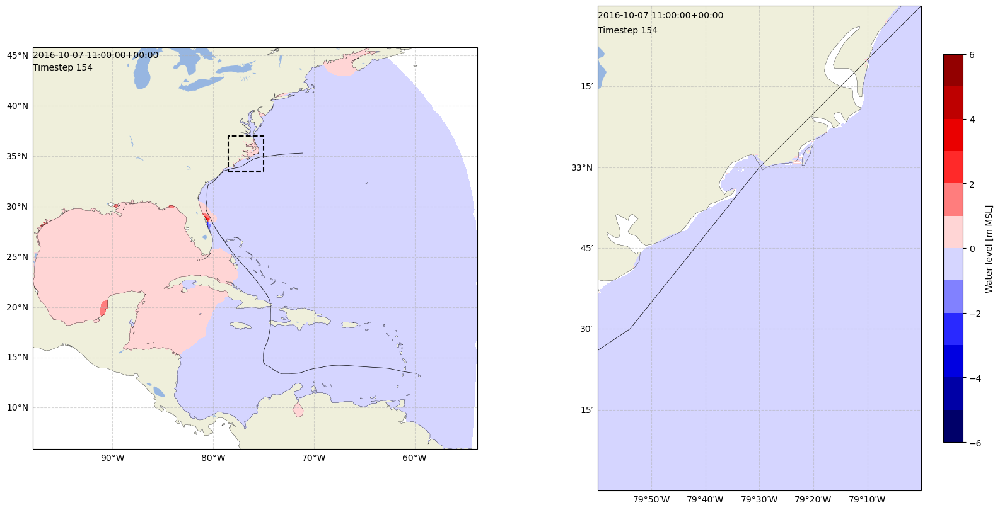

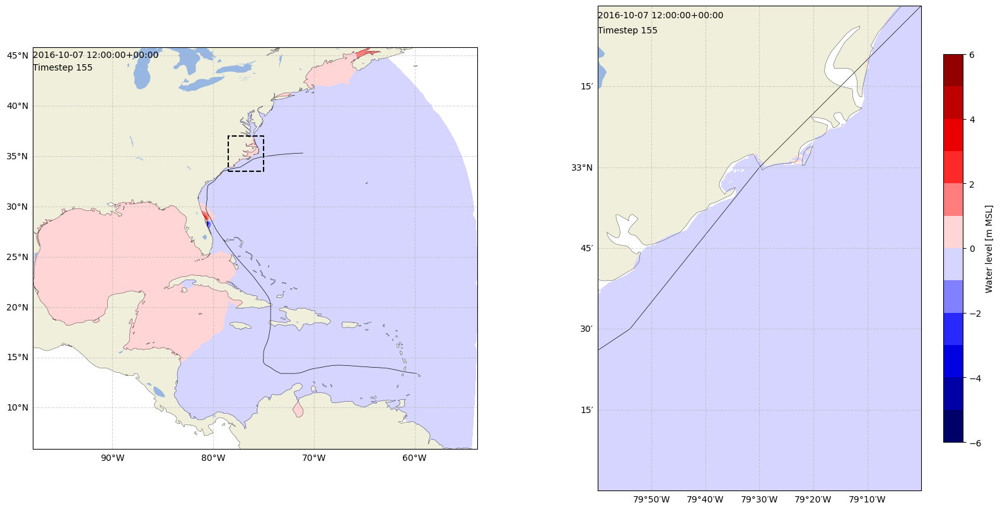

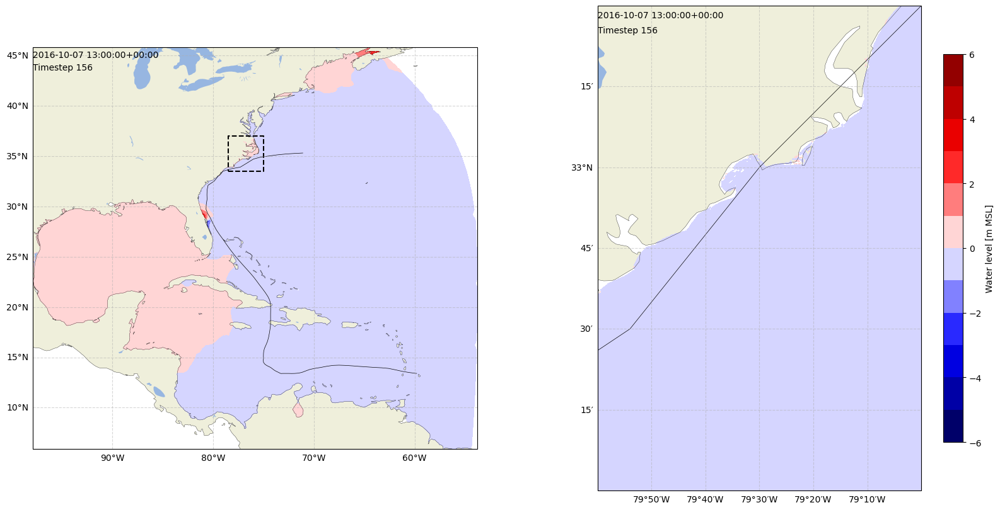

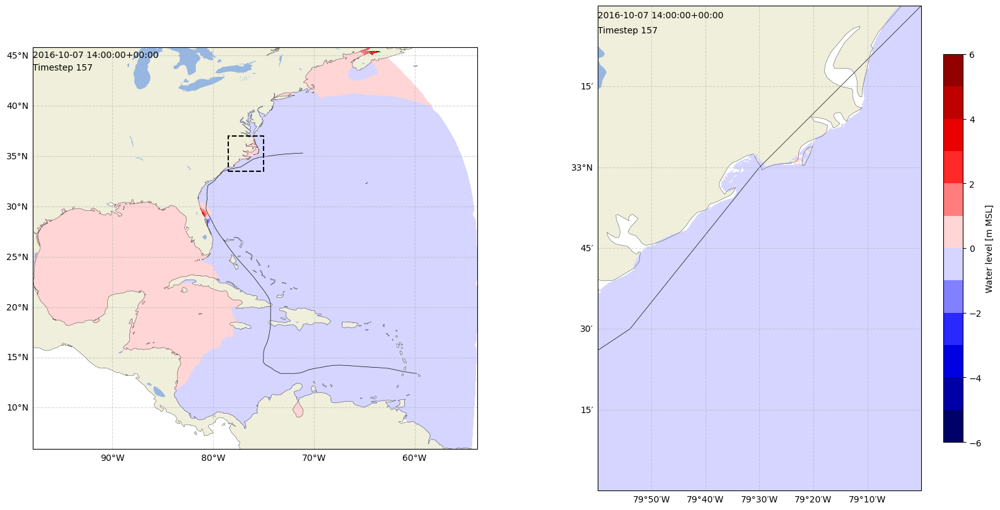

In [56]:
run = runs[1]
track = tracks[run.upper()]
track['max_sustained_wind_ms'] = [x/1.94384 for x in track['max_sustained_wind']]
track['cat'] = [ssScale(x) for x in track['max_sustained_wind_ms'].values]

nc1 = netcdf.Dataset(pathin/run/'fort.63.nc', 'r')
nc2 = netcdf.Dataset(pathin/run/'fort.74.nc', 'r')

ts = list(range(nc1['time'].size))
dates = [pd.to_datetime(nc1['time'].base_date) + pd.Timedelta(seconds = x) for x in nc1['time'][:]]

for t in tqdm(ts[-10:]):

        fig, axs = plt.subplots(ncols = 2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize = (20, 10))

        plot2D(nc1, 'zeta', np.arange(-6, 7, 1), ts = t, cbar = False,
                        cmap = 'seismic', background_map=True, ax = axs[0])
        axs[0].plot([-78.5, -75, -75, -78.5, -78.5], [33.5, 33.5, 37, 37, 33.5], ls = '--', c = 'k')
        axs[0].plot(track['lon'].values, track['lat'].values, color = 'k', lw = 0.5)

        plot2D(nc1, 'zeta', np.arange(-6, 7, 1), ts = t, cbar = True, cb_label = 'Water level [m MSL]',
                        cmap = 'seismic', background_map=True, xlims = [-80, -79], ylims = [32, 33.5],
                        ax = axs[1], fig = fig, cb_shrink = 0.8)
        axs[1].plot(track['lon'].values, track['lat'].values, color = 'k', lw = 0.5)

In [57]:
nc = netcdf.Dataset(r'/mnt/coe/engr/admin/ccee/Admin/ccee/jcdietri/jcdietri/Projects/2016-2020-DHS-CRCoE/Tomas/ADCIRC/Mathew/maxele.63.nc')

In [59]:
nc

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF3_CLASSIC data model, file format NETCDF3):
    _FillValue: -99999.0
    model: ADCIRC
    version: v54-dev-41-g0c39ce6-modified
    grid_type: Triangular
    description: min100max50k
    agrid: min100max50k
    rundes: min100max50k
    runid: Matthew_2016
    title: OceanMesh2D
    institution: Affiliation
    source: Made by OceanMesh2D
    history: History: None
    references: https://github.com/CHLNDDEV/OceanMesh2D/
    comments: Comments: None
    host: Host: Name
    convention: Metric, Datum
    Conventions: UGRID-0.9.0
    contact: name@instit.edu
    creation_date: 2022-01-28  8:23:20 -05:00
    modification_date: 2022-01-28  8:23:20 -05:00
    fort.15: ==== Input File Parameters (below) ====
    dt: 2.0
    ihot: 67
    ics: 2
    nolibf: 1
    nolifa: 2
    nolica: 1
    nolicat: 1
    nwp: 2
    ncor: 1
    ntip: 1
    nws: 12
    nramp: 1
    tau0: -3.0
    statim: 0.0
    reftim: 0.0
    rnday: 25.0
    dramp: 5.0
   